# 1. Initializations

## 1.1 General imports

In [1]:
### general
import logging
from smartcheck.logger_config import setup_logger
setup_logger(logging.INFO)
import itertools

### data management
import pandas as pd
import numpy as np

### machine learning (scikit-learn)
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.compose import ColumnTransformer

### graphical
import matplotlib.pyplot as plt
# for jupyter notebook management
%matplotlib inline

## 1.2 Dataframe imports

In [2]:
import smartcheck.dataframe_common as dfc
import smartcheck.dataframe_project_specific as dfps

## 1.3 Preprocessing & Modeling imports

In [3]:
import smartcheck.preprocessing_project_specific as pps
import smartcheck.modeling_project_specific as mps

# 2. Loading and Preprocessing

In [4]:
df_cpt_raw = dfc.load_dataset_from_config('velo_comptage_ml_ready_data', sep=',', index_col=0)

if df_cpt_raw is not None and isinstance(df_cpt_raw, pd.DataFrame):
    df_cpt = df_cpt_raw.copy()

[INFO]-[2025-07-14 18:30:43,853] [smartcheck.dataframe_common] File path resolved from configuration : https://drive.google.com/file/d/1elLeEL-z4hCZZ4L4gkvFKoEUMlrwxl6w/view?usp=sharing.
[INFO]-[2025-07-14 18:30:43,856] [smartcheck.dataframe_common] File ID extracted from URL: 1elLeEL-z4hCZZ4L4gkvFKoEUMlrwxl6w
[INFO]-[2025-07-14 18:30:44,652] [smartcheck.dataframe_common] Big file mechanism : Attempting download from confirmation URL.


In [5]:
df_cpt.info()

<class 'pandas.core.frame.DataFrame'>
Index: 942554 entries, 0 to 942553
Data columns (total 16 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   identifiant_du_compteur         942554 non-null  object 
 1   nom_du_site_de_comptage         942554 non-null  object 
 2   comptage_horaire                942554 non-null  int64  
 3   date_et_heure_de_comptage       942554 non-null  object 
 4   orientation_compteur            942554 non-null  object 
 5   latitude                        942554 non-null  float64
 6   longitude                       942554 non-null  float64
 7   arrondissement                  942554 non-null  object 
 8   jour_ferie                      942554 non-null  int64  
 9   vacances_scolaires              942554 non-null  object 
 10  temperature_2m_c                942554 non-null  float64
 11  weather_code_wmo_code           942554 non-null  int64  
 12  rain_mm              

## 2.1 Preprocessing pipelines

In [6]:
keep_cols = [
    "nom_du_site_de_comptage",
    "comptage_horaire",
    "date_et_heure_de_comptage",
    "orientation_compteur",
    "latitude",
    "longitude",
    "arrondissement",
    "jour_ferie",
    "vacances_scolaires",
    "temperature_2m_c",
    "rain_mm",
    "snowfall_cm",
    # "weather_code_wmo_code",
    "elevation",
    "weather_code_wmo_code_category",
]

pipe_preproc = Pipeline([
    ("filter_columns", pps.ColumnFilterTransformer(columns_to_keep=keep_cols)),
    ("add_datetime_features", pps.DatetimePeriodicsTransformer(timestamp_col="date_et_heure_de_comptage")),
])

df_preproc = pipe_preproc.fit_transform(df_cpt)
if df_preproc is not None and isinstance(df_preproc, pd.DataFrame):
    df = df_preproc.copy()

In [7]:
# Verification des distributions après preprocessing
df.info()
display(df.select_dtypes(include=np.number).describe())
display(df.select_dtypes(include='object').describe())

<class 'pandas.core.frame.DataFrame'>
Index: 942554 entries, 0 to 942553
Data columns (total 31 columns):
 #   Column                                     Non-Null Count   Dtype                       
---  ------                                     --------------   -----                       
 0   nom_du_site_de_comptage                    942554 non-null  object                      
 1   comptage_horaire                           942554 non-null  int64                       
 2   orientation_compteur                       942554 non-null  object                      
 3   latitude                                   942554 non-null  float64                     
 4   longitude                                  942554 non-null  float64                     
 5   arrondissement                             942554 non-null  object                      
 6   jour_ferie                                 942554 non-null  int64                       
 7   vacances_scolaires                         

,comptage_horaire,latitude,longitude,jour_ferie,temperature_2m_c,rain_mm,snowfall_cm,elevation,date_et_heure_de_comptage_year,date_et_heure_de_comptage_month,...,date_et_heure_de_comptage_week,date_et_heure_de_comptage_week_end,date_et_heure_de_comptage_sin_hour,date_et_heure_de_comptage_cos_hour,date_et_heure_de_comptage_sin_day_of_week,date_et_heure_de_comptage_cos_day_of_week,date_et_heure_de_comptage_sin_month,date_et_heure_de_comptage_cos_month,date_et_heure_de_comptage_sin_week,date_et_heure_de_comptage_cos_week
count,942554.000000,942554.000000,942554.000000,942554.000000,942554.000000,942554.000000,942554.000000,942554.000000,942554.000000,942554.000000,...,942554.0,942554.000000,942554.000000,9.425540e+05,942554.000000,942554.000000,9.425540e+05,9.425540e+05,942554.0,942554.0
mean,77.876087,48.851109,2.347716,0.026753,12.575794,0.099994,0.000823,46.969370,2024.255929,6.166625,...,24.886069,0.287818,-0.000200,-4.949572e-04,-0.004988,0.001378,1.013447e-01,-1.838471e-02,0.109678,0.009423
std,106.884406,0.019903,0.040857,0.161360,6.674967,0.671425,0.025361,16.438146,0.436382,3.410518,...,14.851372,0.452746,0.707236,7.069778e-01,0.706776,0.707419,7.308254e-01,6.747492e-01,0.733044,0.671215
min,0.000000,48.819640,2.265260,0.000000,-4.600000,0.000000,0.000000,26.000000,2024.000000,1.000000,...,1.0,0.000000,-1.000000,-1.000000e+00,-0.974928,-0.900969,-1.000000e+00,-1.000000e+00,-1.0,-1.0
25%,11.000000,48.834624,2.314274,0.000000,7.800000,0.000000,0.000000,36.000000,2024.000000,3.000000,...,12.0,0.000000,-0.707107,-7.071068e-01,-0.781831,-0.900969,-5.000000e-01,-5.000000e-01,-0.663123,-0.663123
50%,42.000000,48.848370,2.354750,0.000000,12.400000,0.000000,0.000000,45.000000,2024.000000,6.000000,...,23.0,0.000000,0.000000,-1.836970e-16,0.000000,-0.222521,1.224647e-16,6.123234e-17,0.239316,-0.0
75%,97.000000,48.863820,2.375870,0.000000,17.000000,0.000000,0.000000,55.000000,2025.000000,9.000000,...,38.0,1.000000,0.707107,7.071068e-01,0.781831,0.623490,8.660254e-01,5.000000e-01,0.885456,0.663123
max,1574.000000,48.891410,2.411430,1.000000,37.200000,46.500000,1.260000,112.000000,2025.000000,12.000000,...,52.0,1.000000,1.000000,1.000000e+00,0.974928,1.000000,1.000000e+00,1.000000e+00,1.0,1.0


,nom_du_site_de_comptage,orientation_compteur,arrondissement,vacances_scolaires,weather_code_wmo_code_category
count,942554,942554,942554,942554,942554
unique,66,8,17,7,7
top,27 quai de la Tournelle,NE-SO,Paris 13e Arrondissement,aucune,cloud_variation
freq,19670,157136,147364,630187,756884


#### Feature selection (retour d'expérience sur VIF d'autre notebook pour même cible de comparaison)

In [8]:
col_to_drop1 = [
    'date_et_heure_de_comptage_day_of_year',
    'date_et_heure_de_comptage_year',
    'date_et_heure_de_comptage_month',
    'date_et_heure_de_comptage_day',
    'date_et_heure_de_comptage_day_of_week',
    'date_et_heure_de_comptage_hour'
]

In [9]:
col_to_drop2 = [
    'latitude',
    'longitude',
    'date_et_heure_de_comptage_sin_month',
    'date_et_heure_de_comptage_sin_week',
]

In [10]:
col_to_drop3 = [
    'date_et_heure_de_comptage_cos_month',
]

In [11]:
df = df.drop(columns=col_to_drop1+col_to_drop2+col_to_drop3)
df_feat_sel = df.copy()

## 2.2 Column Transformers

#### Categorical and Numerical

In [12]:
num_col = list(df.drop(columns='comptage_horaire').select_dtypes(include=np.number).columns)
cat_col = list(df.select_dtypes(include='object').columns)
# s_scaler = StandardScaler()
mm_scaler = MinMaxScaler()
ohe_enc = OneHotEncoder(
    # drop='first', # évites la multicolinéarité mais déclenche des warning (les catégories inconnues participent a renforcer la catégorie droppée...)
    handle_unknown='ignore'
)
tr_num_col = Pipeline(
    steps = [
        ('standardisation', mm_scaler)
    ]
)
tr_cat_col = Pipeline(
    steps = [
        ('encoder', ohe_enc)
    ]
)
tr_columns = ColumnTransformer(
    transformers=[ 
        ('num_col_transf', tr_num_col, num_col),
        ('cat_col_transf', tr_cat_col, cat_col)
    ],
    remainder='drop',
)

# 3. Regression modeling

In [13]:
liste_compteurs = [
    ('Pont de Bercy', 'NE-SO'),
    ('Pont de Bercy', 'NE-SO'),
    ('135 avenue Daumesnil', 'SE-NO'),
    ("180 avenue d'Italie", 'N-S'),
    ('27 quai de la Tournelle', 'NO-SE'),
    ('27 quai de la Tournelle', 'SE-NO'),
]

## 3.1 Linear Regresion

In [14]:
pipe_linear_regression = Pipeline(
    steps= [
        ('prep', tr_columns), 
        ('reg',LinearRegression())
    ]
)

#### SANS AR(1) MA(24)

In [15]:
models_lr_simple_results = {}
# pas d'aggrégation, juste un regroupement par nom de site et orientation (utilisé ensuite dans la boucle for)
grouped = df.groupby(["nom_du_site_de_comptage", "orientation_compteur"])
for compteur_id, df_compteur in grouped:
    if compteur_id not in liste_compteurs:
        continue
    # tri chrono + pipeline prétraitement + split
    df_compteur = df_compteur.sort_values("date_et_heure_de_comptage_local")
    X_train, X_train_dates, X_test, X_test_dates, y_train, y_test = \
        dfps.train_test_split_time_aware(
            df_compteur,
            timestamp_cols=["date_et_heure_de_comptage_utc", "date_et_heure_de_comptage_local"],
            target_col="comptage_horaire"
        )
    # pipeline + fit
    pipe_generic = pipe_linear_regression.fit(X_train, y_train)
    # predictions
    y_test_pred = pipe_generic.predict(X_test)
    # stockage des resultats
    models_lr_simple_results[compteur_id] = {
        "pipe":pipe_generic,
        "X_train":X_train,
        "X_train_dates":X_train_dates,
        "X_test":X_test,
        "X_test_dates":X_test_dates,
        "y_train":y_train,
        "y_test":y_test,
        "y_test_pred":y_test_pred,
    }

#### AVEC AR(1) MA(24)

In [16]:
models_lr_ar1ma24_results = {}

# Grouping by site + orientation
grouped = df.groupby(["nom_du_site_de_comptage", "orientation_compteur"])

for compteur_id, df_compteur in grouped:
    if compteur_id not in liste_compteurs:
        continue
    df_compteur = df_compteur.sort_values("date_et_heure_de_comptage_local")

    # Chronological split
    X_train, X_train_dates, X_test, X_test_dates, y_train, y_test = dfps.train_test_split_time_aware(
        df_compteur,
        timestamp_cols=[
            "date_et_heure_de_comptage_utc",
            "date_et_heure_de_comptage_local"
        ],
        target_col="comptage_horaire"
    )
    # Fit AR feature transformer on training set
    tr_ar_feats = pps.AutoregressiveFeaturesTransformer(rolling_window=24)
    X_train_ar, X_train_dates_ar, y_train_ar = tr_ar_feats.fit_transform(
        X_train, X_train_dates, y_train
    )
    # Train model
    pipe_generic = pipe_linear_regression.fit(X_train_ar, y_train_ar)

    # Transform test set without refitting
    X_test_ar, X_test_dates_ar, y_test_ar = tr_ar_feats.transform_test(
        X_test, X_test_dates, y_test
    )

    # Predict
    y_test_pred = pipe_generic.predict(X_test_ar)

    # Save results
    models_lr_ar1ma24_results[compteur_id] = {
        "pipe":pipe_generic,
        "X_train":X_train_ar,
        "X_train_dates":X_train_dates_ar,
        "X_test":X_test_ar,
        "X_test_dates":X_test_dates_ar,
        "y_train":y_train_ar,
        "y_test":y_test_ar,
        "y_test_pred":y_test_pred,
    }

## 3.1 RandomForest Regresion

In [17]:
pipe_rfr_regression = Pipeline(
    steps= [
        ('prep', tr_columns), 
        ('reg',RandomForestRegressor(
            random_state=210995,
            n_jobs=-1,
            n_estimators=100,
            max_depth=25,
            min_samples_leaf=5,
            max_features='sqrt'
        ))
    ]
)

#### SANS AR(1) MA(24)

In [18]:
models_rfr_simple_results = {}
# pas d'aggrégation, juste un regroupement par nom de site et orientation (utilisé ensuite dans la boucle for)
grouped = df.groupby(["nom_du_site_de_comptage", "orientation_compteur"])
for compteur_id, df_compteur in grouped:
    if compteur_id not in liste_compteurs:
        continue
    # tri chrono + pipeline prétraitement + split
    df_compteur = df_compteur.sort_values("date_et_heure_de_comptage_local")
    X_train, X_train_dates, X_test, X_test_dates, y_train, y_test = \
        dfps.train_test_split_time_aware(
            df_compteur,
            timestamp_cols=["date_et_heure_de_comptage_utc", "date_et_heure_de_comptage_local"],
            target_col="comptage_horaire"
        )
    # pipeline + fit
    pipe_generic = pipe_rfr_regression.fit(X_train, y_train)
    # predictions
    y_test_pred = pipe_generic.predict(X_test)
    # stockage des resultats
    models_rfr_simple_results[compteur_id] = {
        "pipe":pipe_generic,
        "X_train":X_train,
        "X_train_dates":X_train_dates,
        "X_test":X_test,
        "X_test_dates":X_test_dates,
        "y_train":y_train,
        "y_test":y_test,
        "y_test_pred":y_test_pred,
    }

#### AVEC AR(1) MA(24)

In [19]:
models_rfr_ar1ma24_results = {}

# Grouping by site + orientation
grouped = df.groupby(["nom_du_site_de_comptage", "orientation_compteur"])

for compteur_id, df_compteur in grouped:
    if compteur_id not in liste_compteurs:
        continue
    
    df_compteur = df_compteur.sort_values("date_et_heure_de_comptage_local")

    # Chronological split
    X_train, X_train_dates, X_test, X_test_dates, y_train, y_test = dfps.train_test_split_time_aware(
        df_compteur,
        timestamp_cols=[
            "date_et_heure_de_comptage_utc",
            "date_et_heure_de_comptage_local"
        ],
        target_col="comptage_horaire"
    )
    # Fit AR feature transformer on training set
    tr_ar_feats = pps.AutoregressiveFeaturesTransformer(rolling_window=24)
    X_train_ar, X_train_dates_ar, y_train_ar = tr_ar_feats.fit_transform(
        X_train, X_train_dates, y_train
    )
    # Train model
    pipe_generic = pipe_rfr_regression.fit(X_train_ar, y_train_ar)

    # Transform test set without refitting
    X_test_ar, X_test_dates_ar, y_test_ar = tr_ar_feats.transform_test(
        X_test, X_test_dates, y_test
    )

    # Predict
    y_test_pred = pipe_generic.predict(X_test_ar)

    # Save results
    models_rfr_ar1ma24_results[compteur_id] = {
        "pipe":pipe_generic,
        "X_train":X_train_ar,
        "X_train_dates":X_train_dates_ar,
        "X_test":X_test_ar,
        "X_test_dates":X_test_dates_ar,
        "y_train":y_train_ar,
        "y_test":y_test_ar,
        "y_test_pred":y_test_pred,
    }

# 4 Performance analysis and visualisation

#### Compteurs "Pont de Bercy", "135 avenue Daumesnil", "180 avenue d'Italie", "27 quai de la Tournelle"


 ******************************************************************************** 
 Modèle Regression linéaire simple : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.2713302100602629, 'rmse': 51.58115031046518, 'mae': 31.54698611243106}


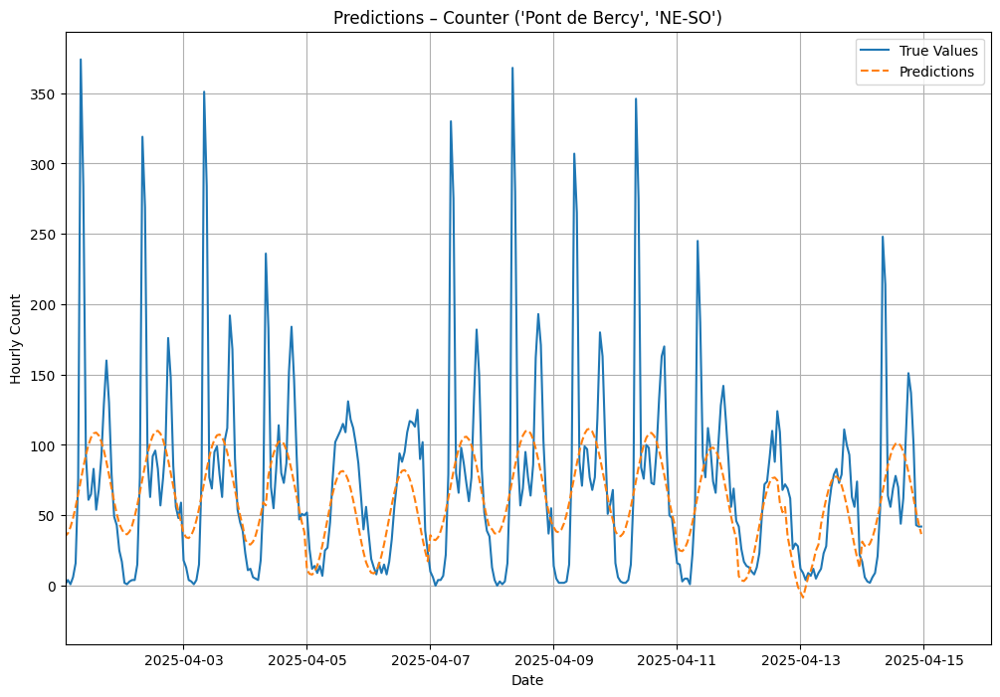

Pente de la droite de régression des résidus dans le temps (dérive) : 0.1141348693265324


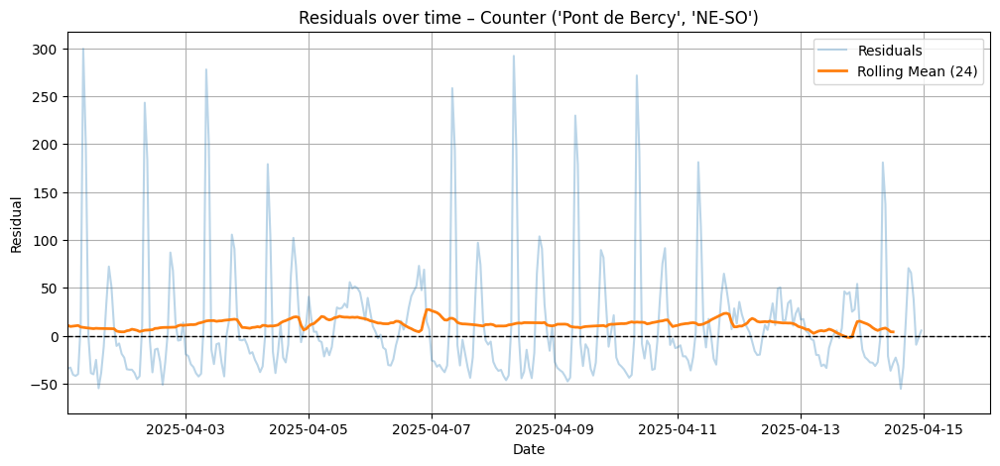

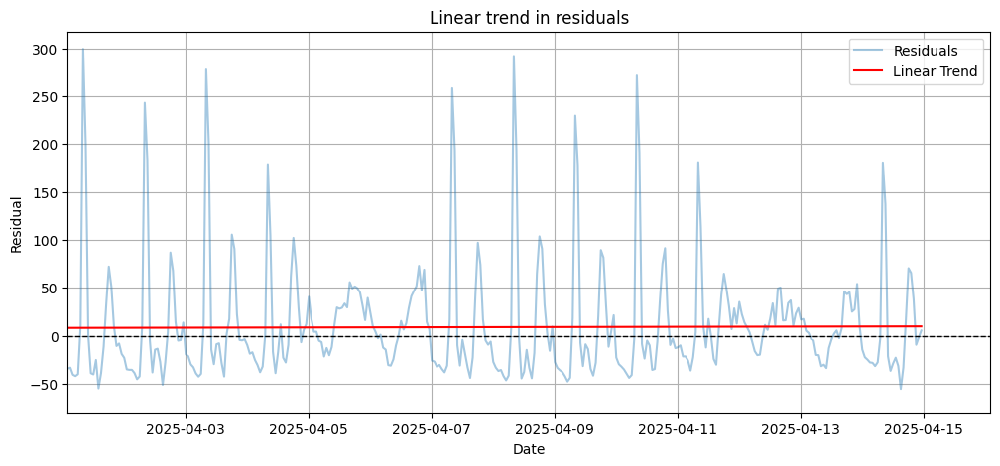

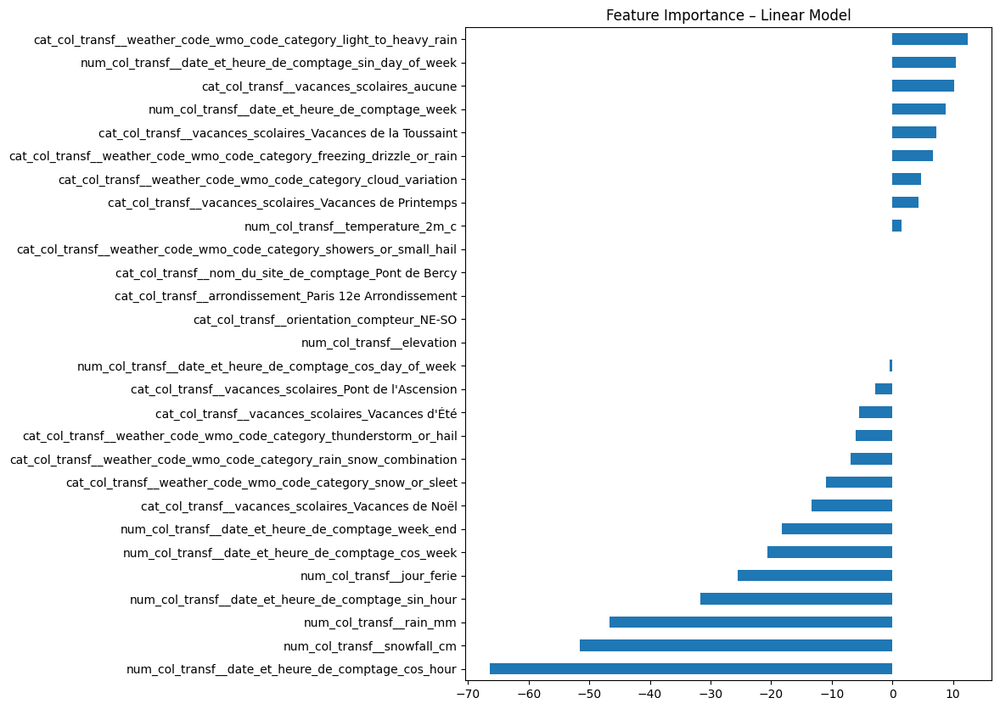


 ******************************************************************************** 
 Modèle Regression linéaire AR1 MM24 : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.27267518024841, 'rmse': 51.513993828206615, 'mae': 31.468454294782646}


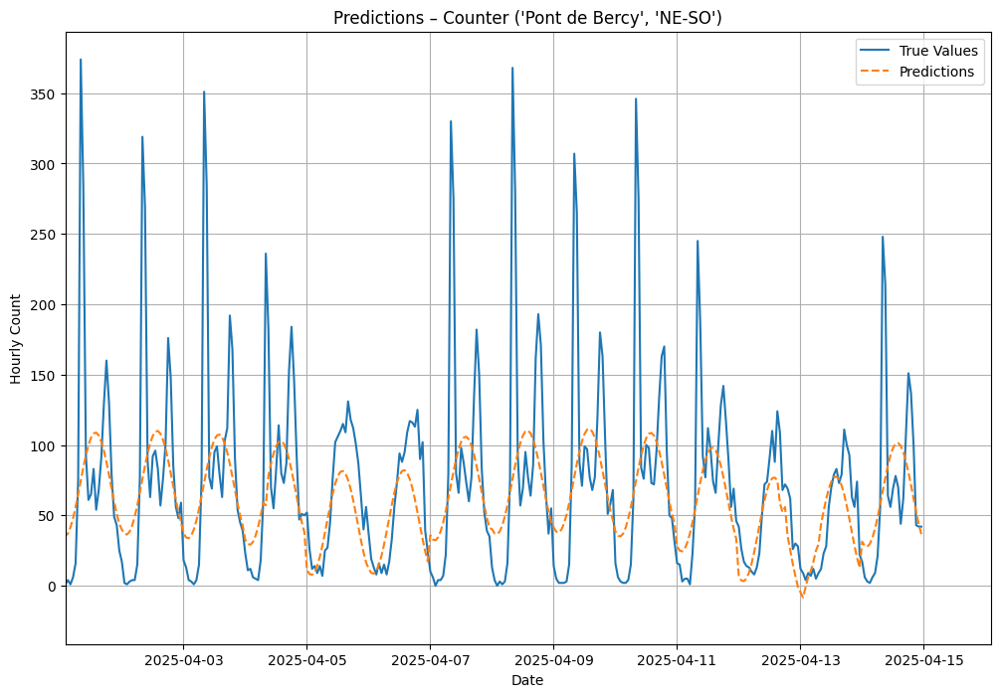

Pente de la droite de régression des résidus dans le temps (dérive) : 0.11959085463390992


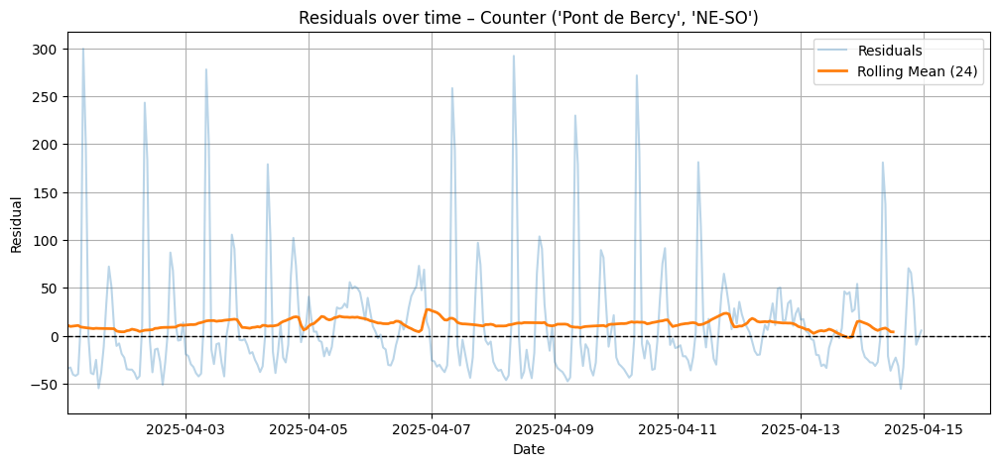

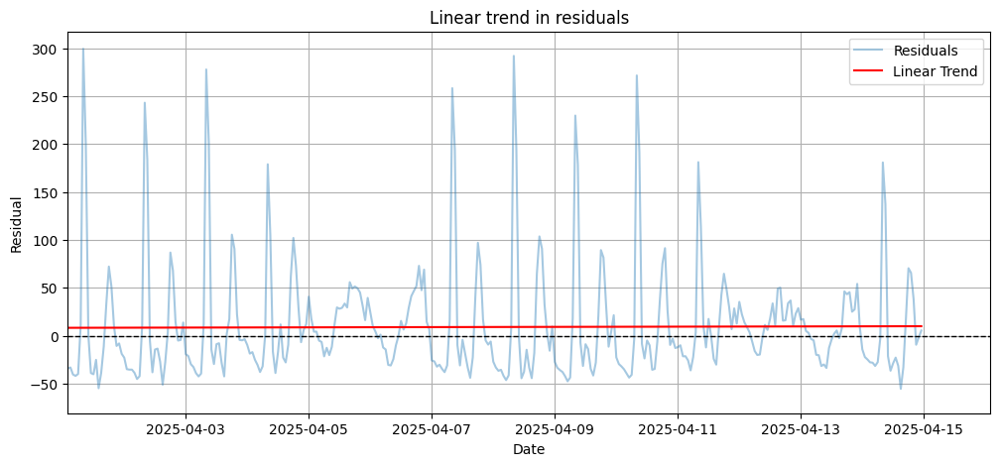

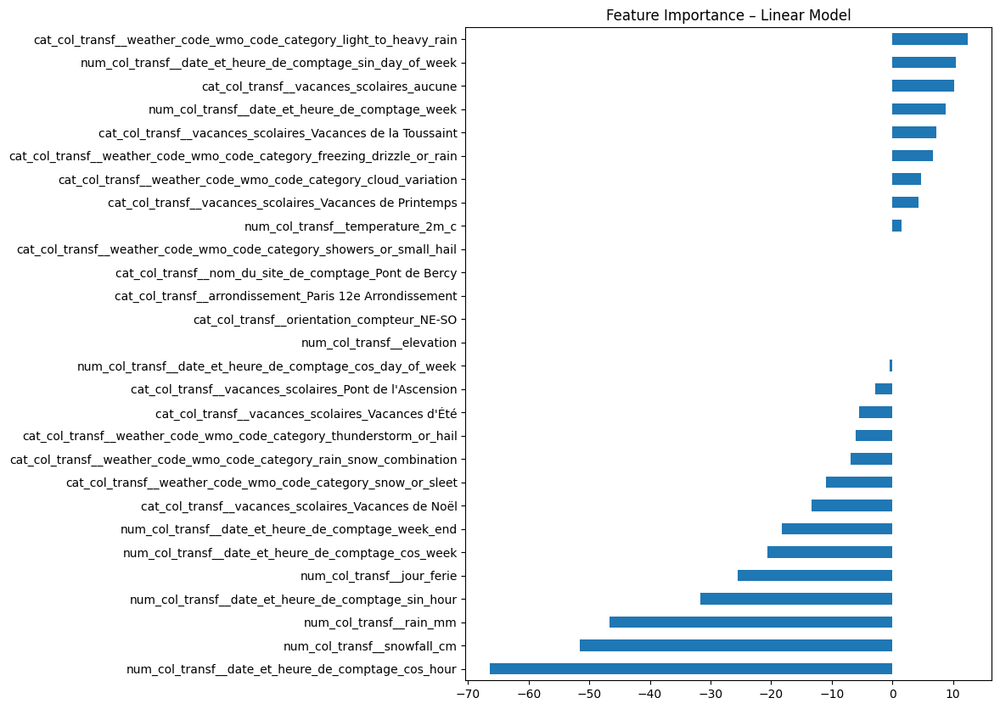


 ******************************************************************************** 
 Modèle Random Frest Regressor simple : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.8934984274128117, 'rmse': 19.719851999964185, 'mae': 13.599083473720333}


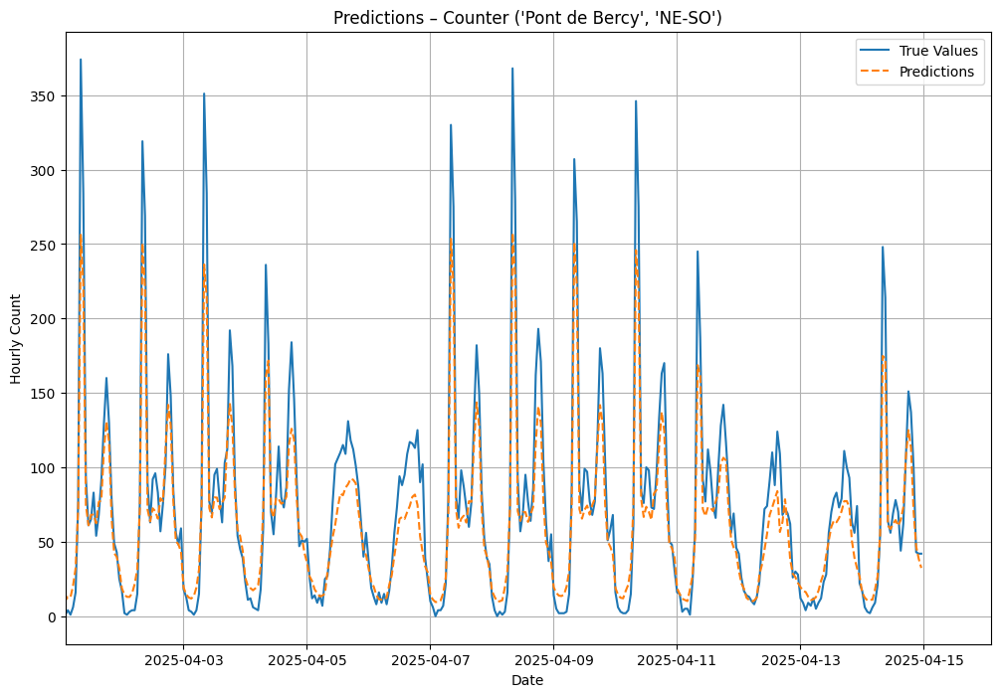

Pente de la droite de régression des résidus dans le temps (dérive) : 0.17881612170991767


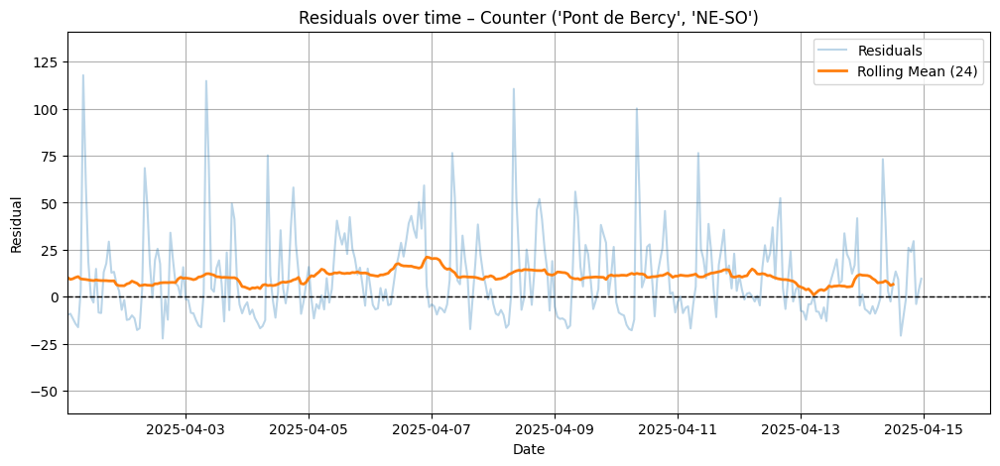

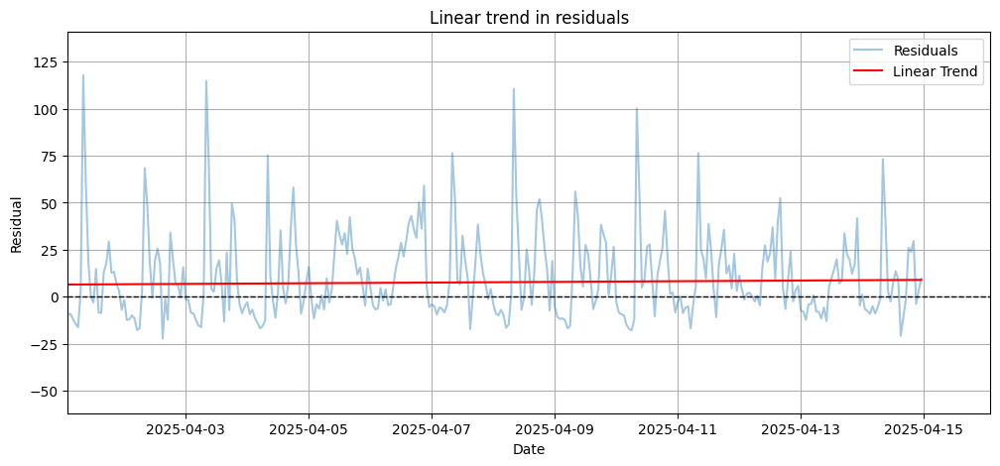


 ******************************************************************************** 
 Modèle Random Frest Regressor AR1 MM24 : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.8965209397670879, 'rmse': 19.430646714688276, 'mae': 13.534744552795205}


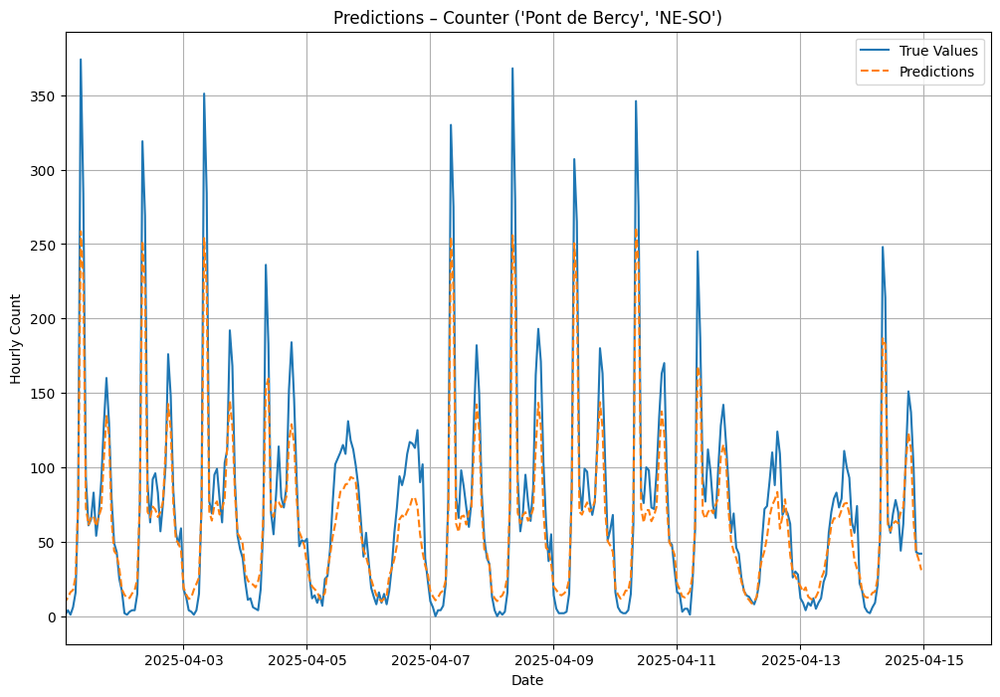

Pente de la droite de régression des résidus dans le temps (dérive) : 0.18565069820541286


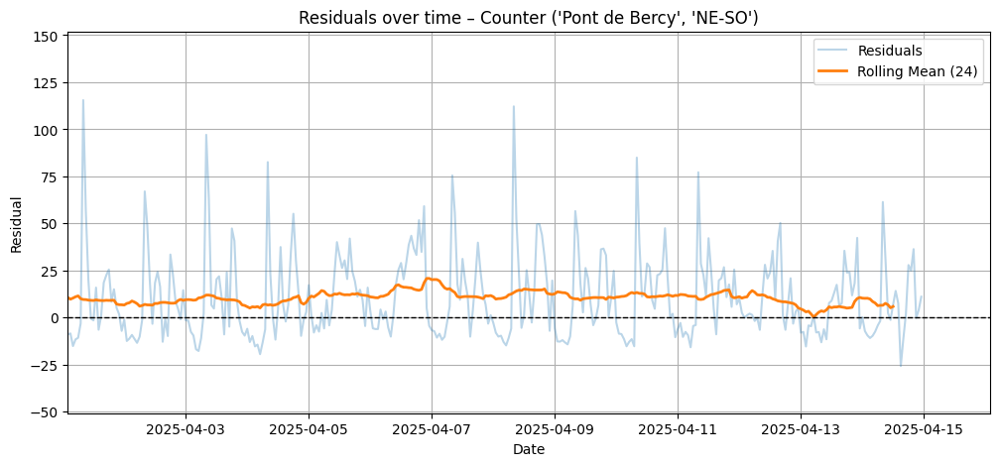

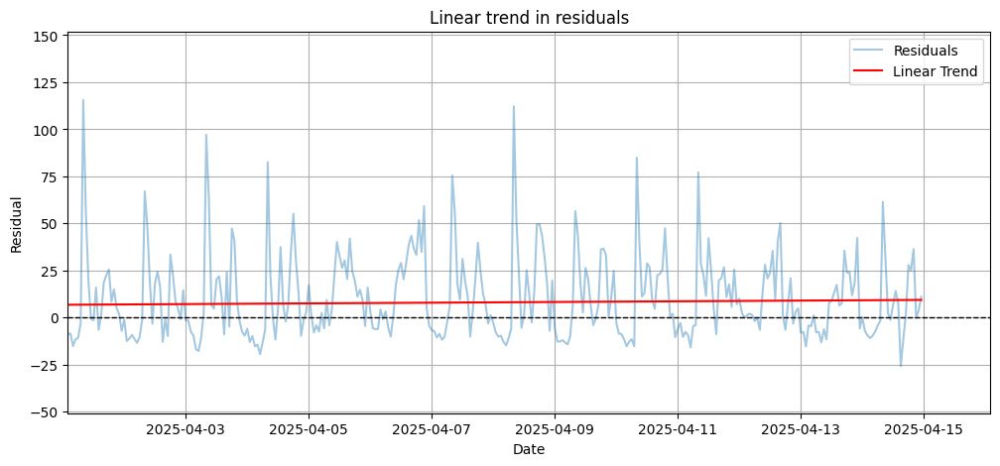


 ******************************************************************************** 
 Modèle Regression linéaire simple : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.2713302100602629, 'rmse': 51.58115031046518, 'mae': 31.54698611243106}


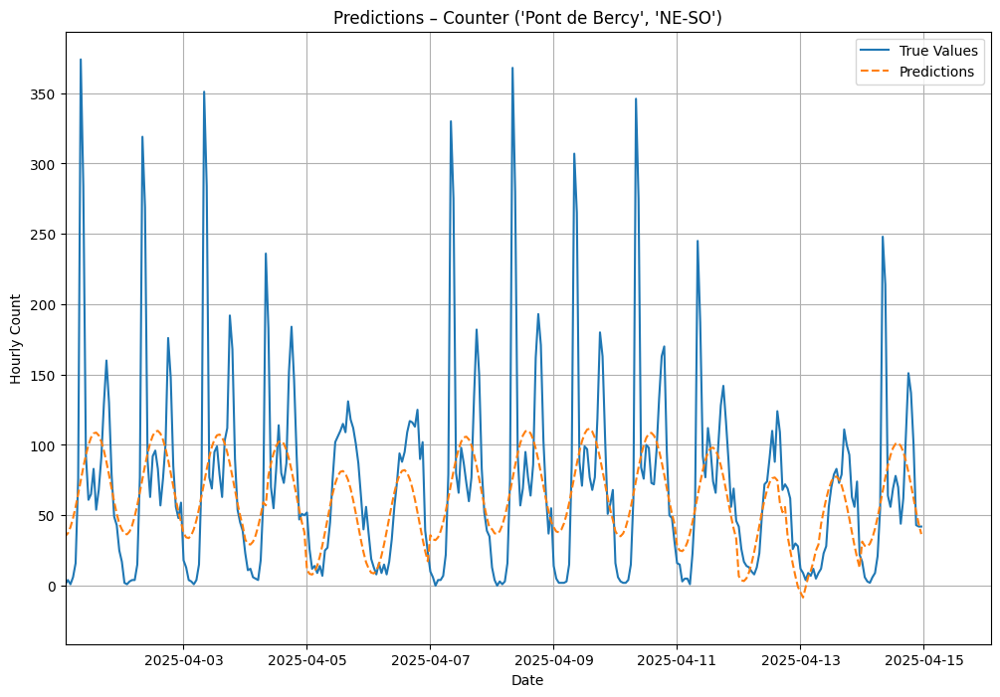

Pente de la droite de régression des résidus dans le temps (dérive) : 0.1141348693265324


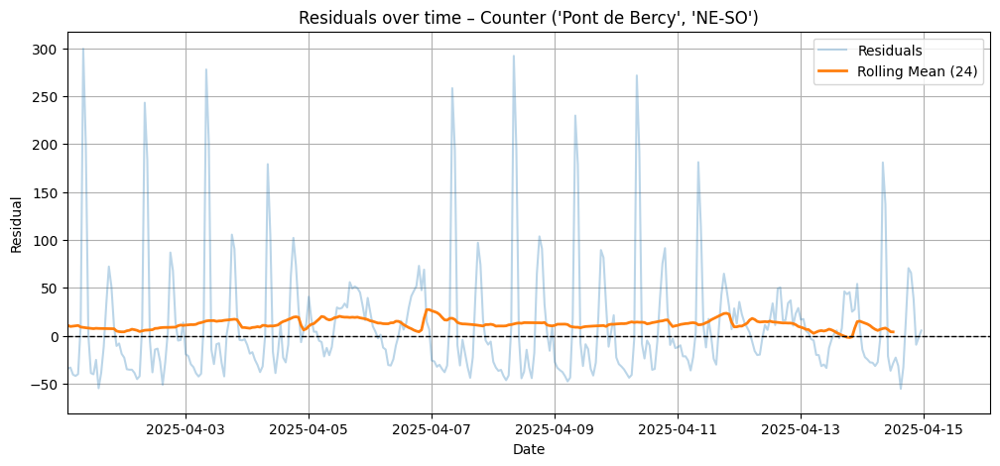

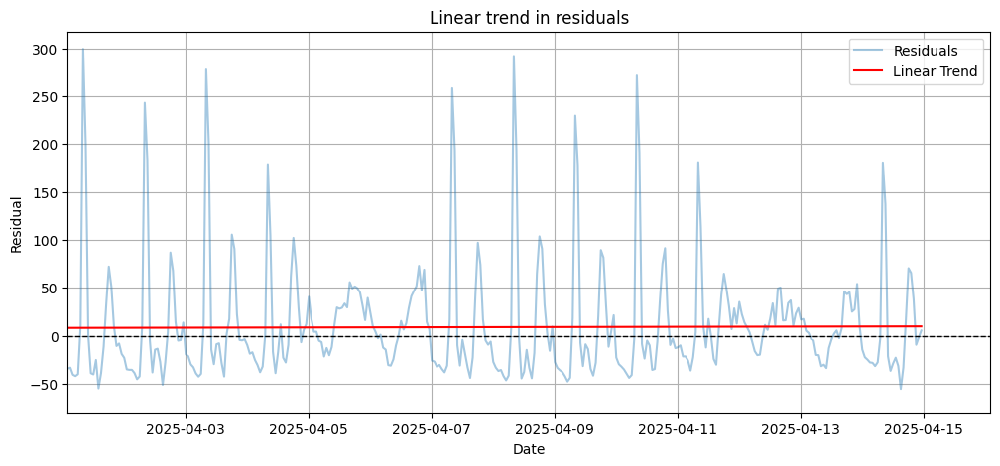

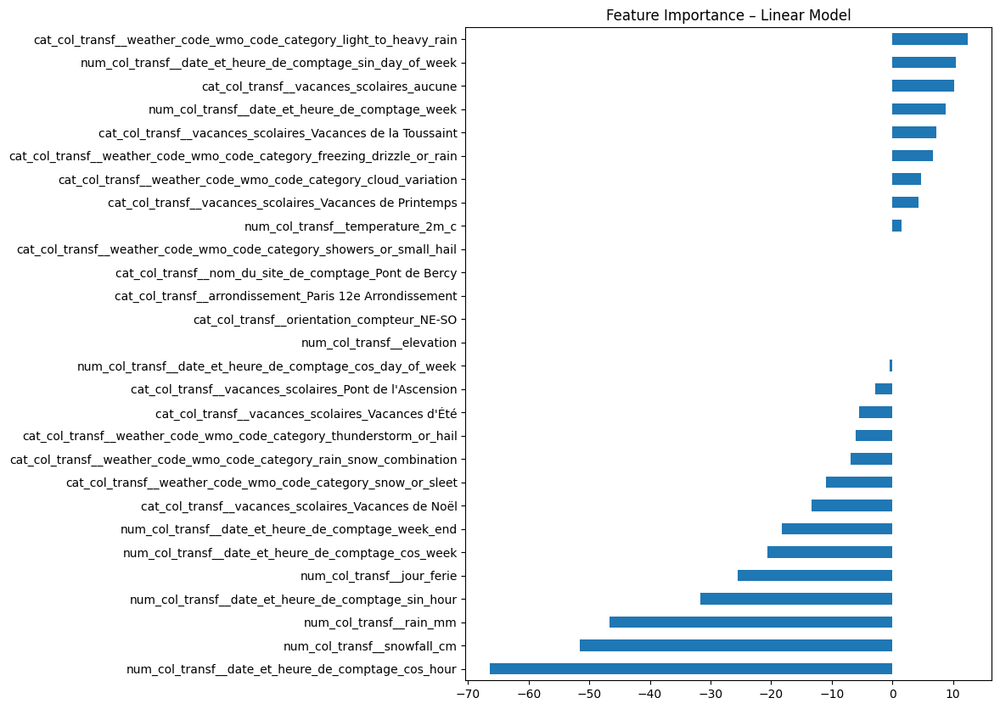


 ******************************************************************************** 
 Modèle Regression linéaire AR1 MM24 : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.27267518024841, 'rmse': 51.513993828206615, 'mae': 31.468454294782646}


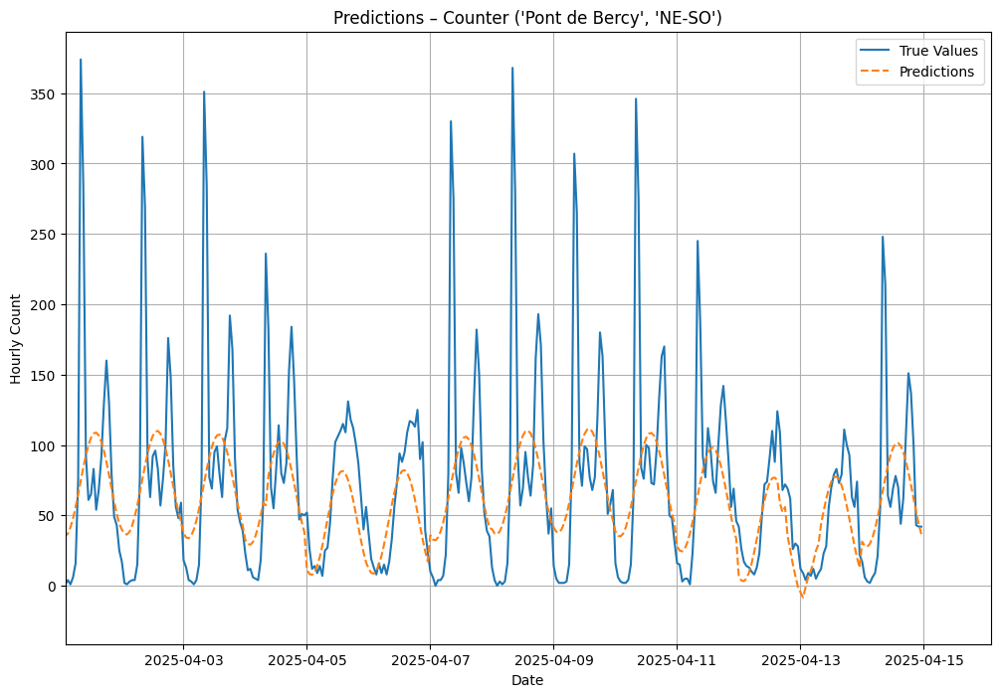

Pente de la droite de régression des résidus dans le temps (dérive) : 0.11959085463390992


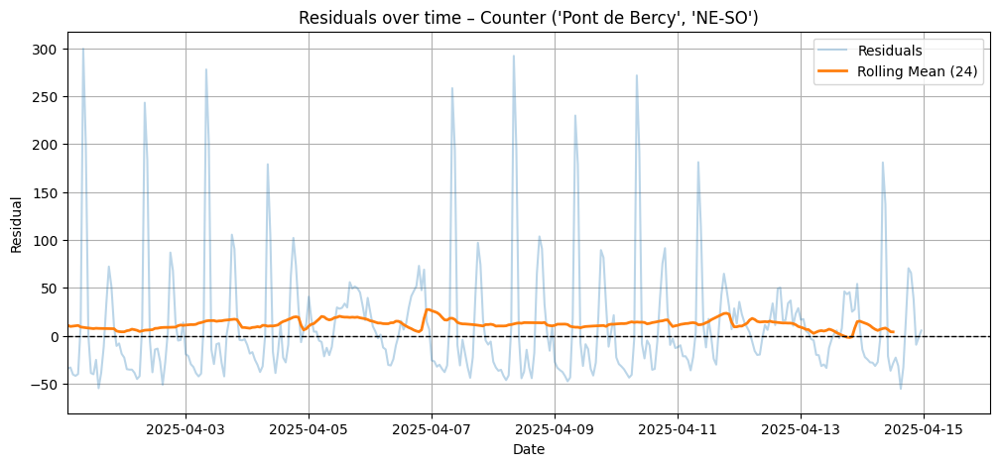

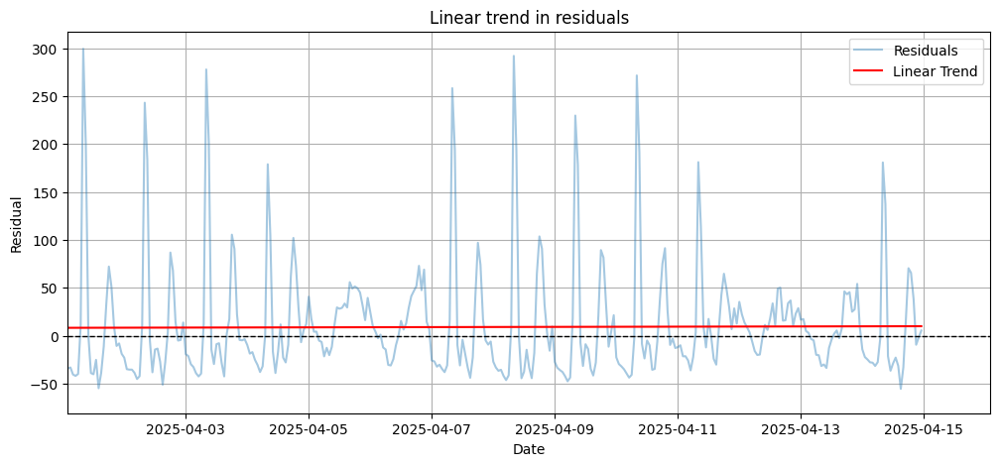

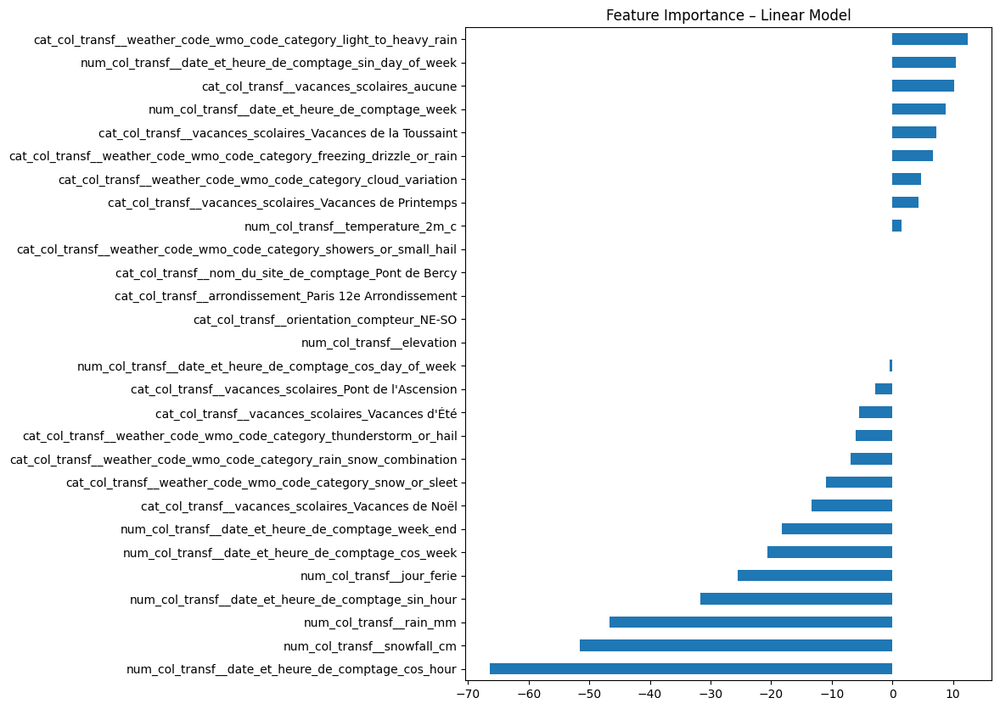


 ******************************************************************************** 
 Modèle Random Frest Regressor simple : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.8934984274128117, 'rmse': 19.719851999964185, 'mae': 13.599083473720333}


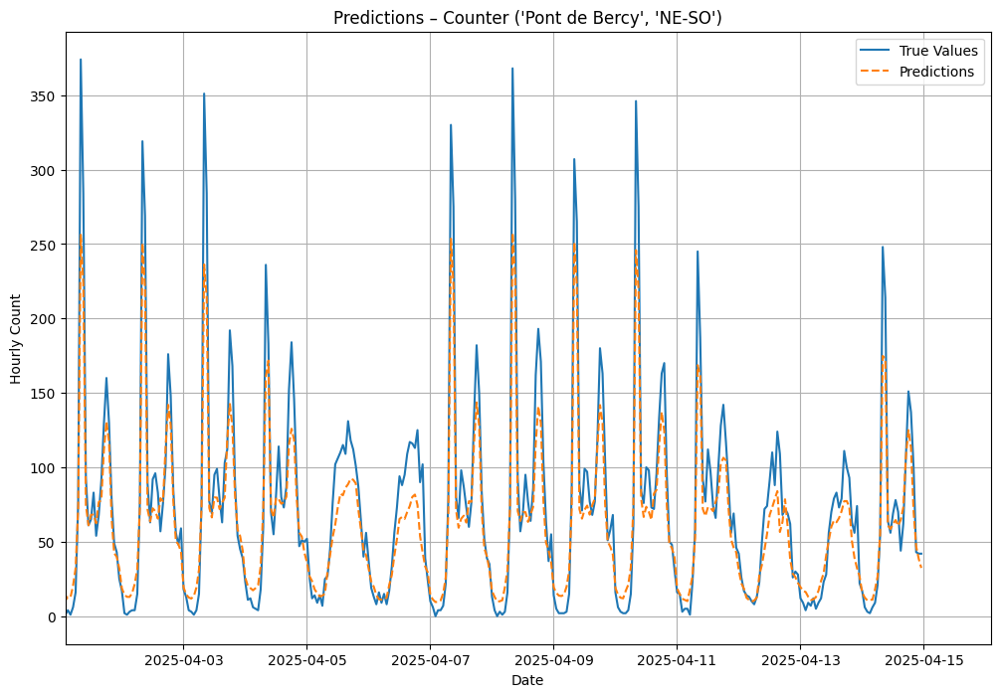

Pente de la droite de régression des résidus dans le temps (dérive) : 0.17881612170991767


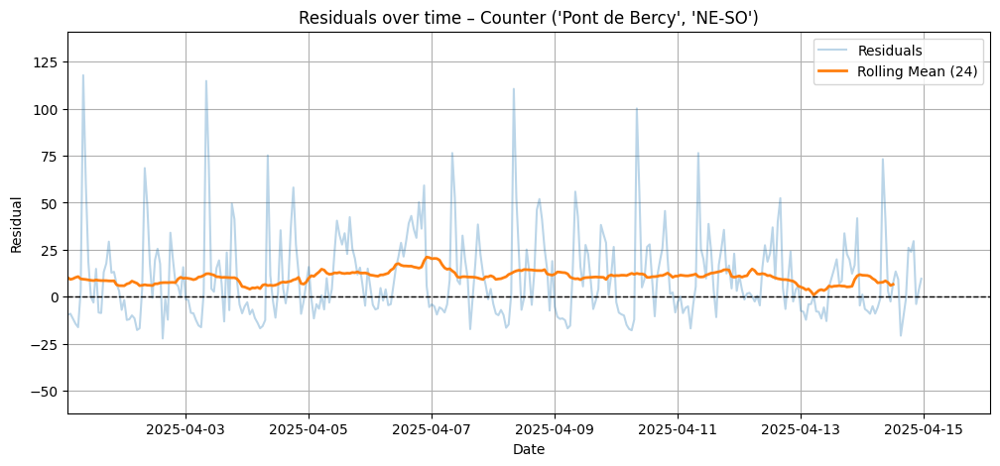

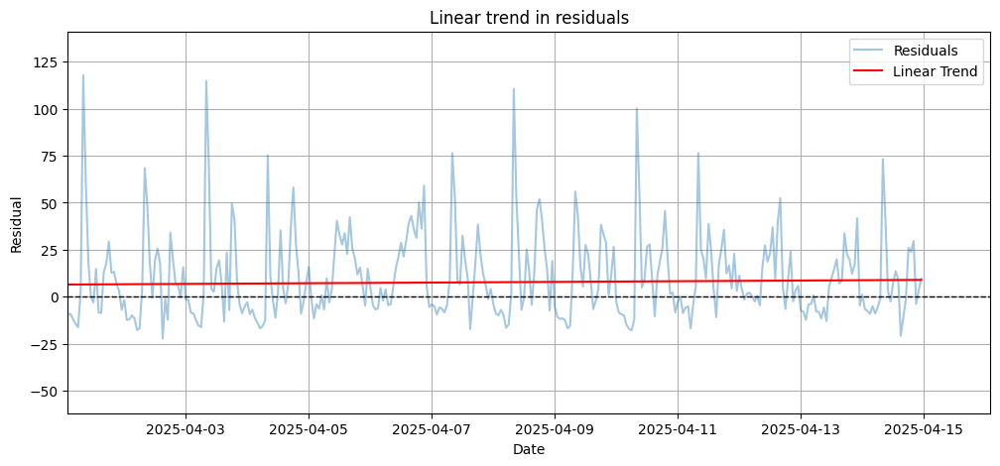


 ******************************************************************************** 
 Modèle Random Frest Regressor AR1 MM24 : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.8965209397670879, 'rmse': 19.430646714688276, 'mae': 13.534744552795205}


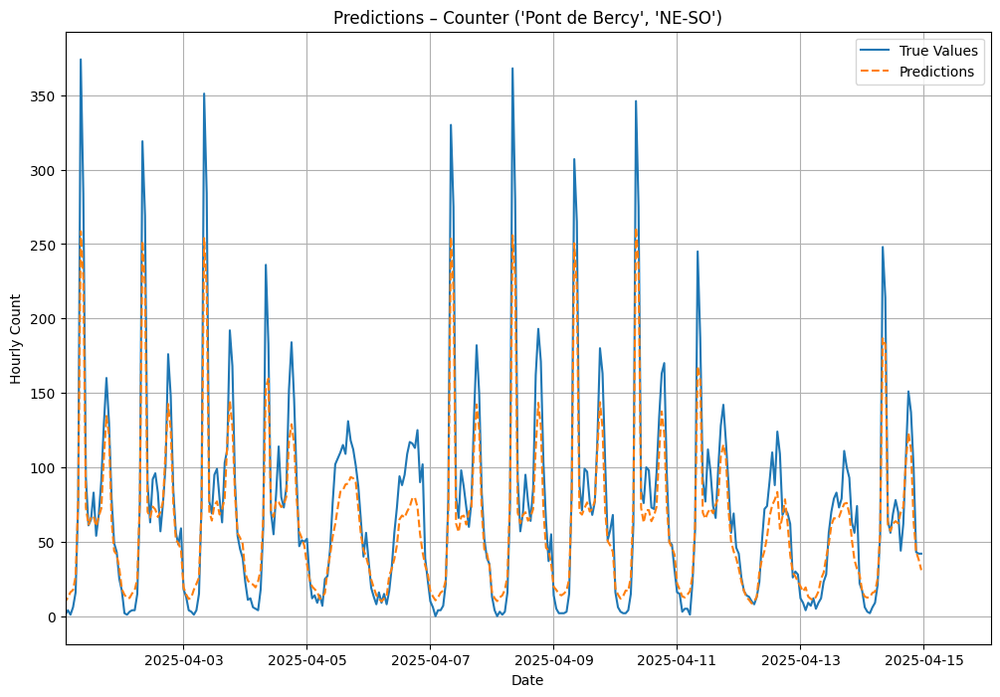

Pente de la droite de régression des résidus dans le temps (dérive) : 0.18565069820541286


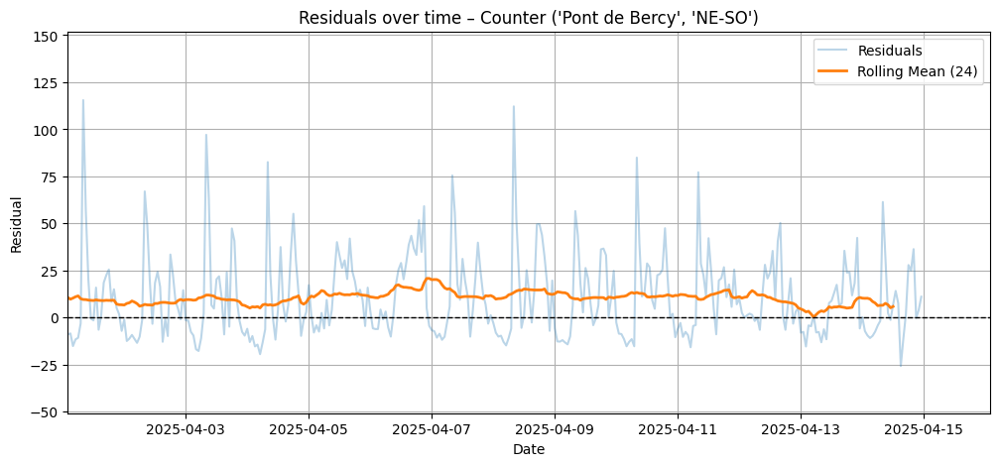

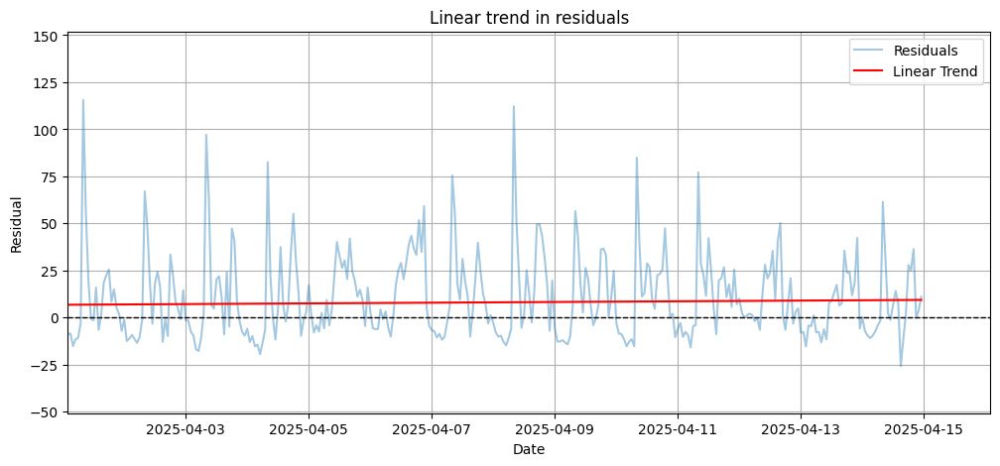


 ******************************************************************************** 
 Modèle Regression linéaire simple : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.4244359009590547, 'rmse': 47.058249678708485, 'mae': 29.968844480149098}


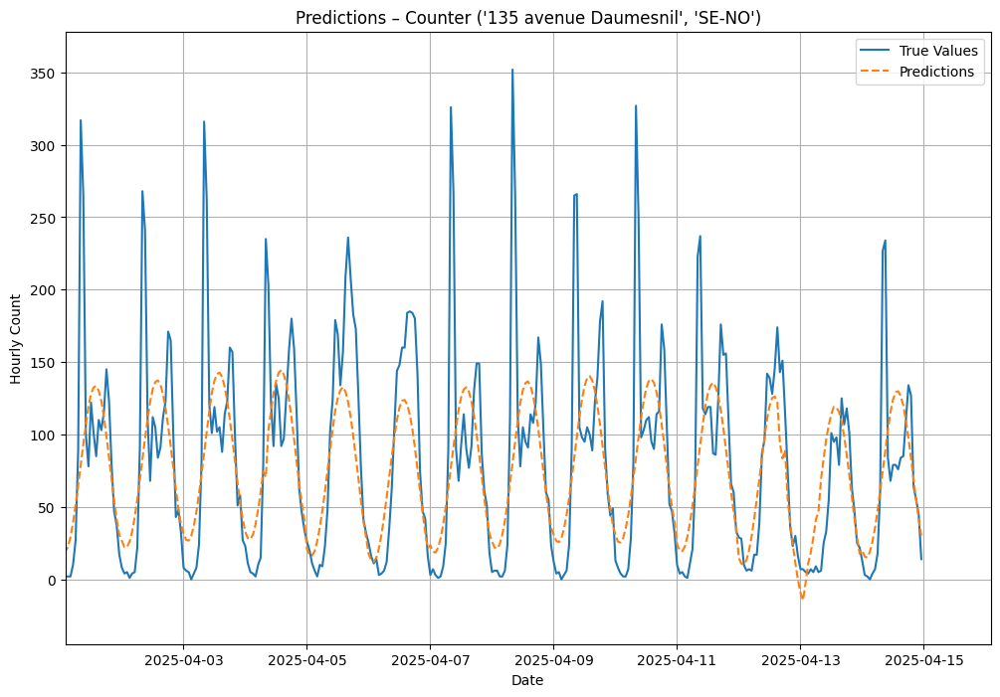

Pente de la droite de régression des résidus dans le temps (dérive) : 0.08575415354221165


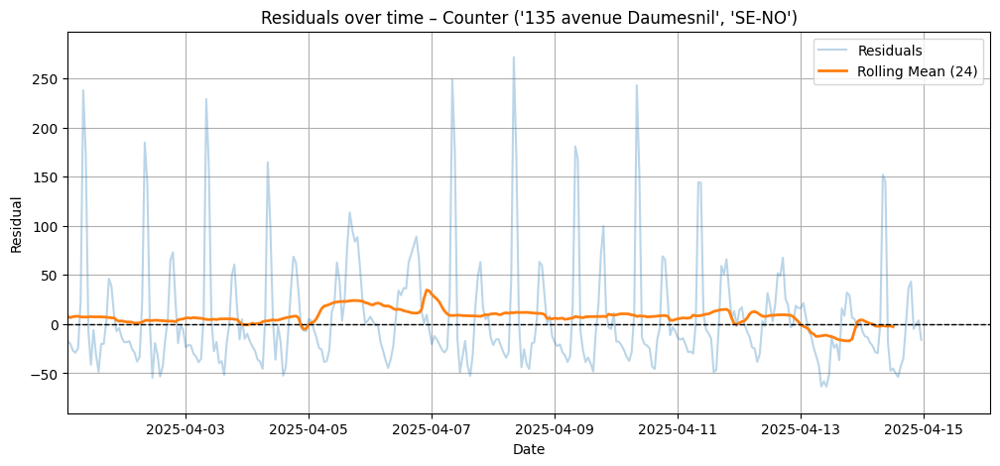

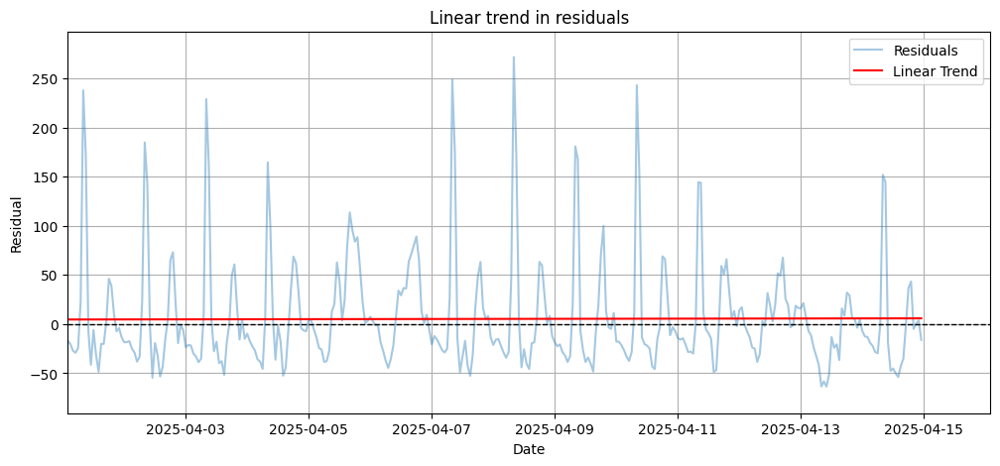

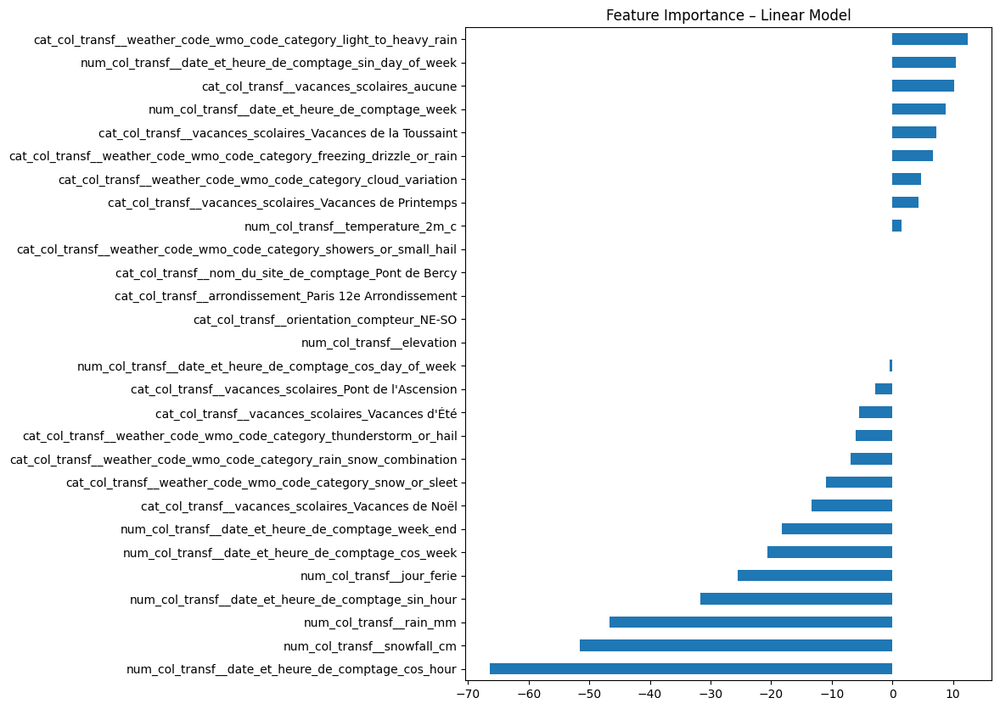


 ******************************************************************************** 
 Modèle Regression linéaire AR1 MM24 : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.42503716894263854, 'rmse': 47.087541303634346, 'mae': 29.945543690262788}


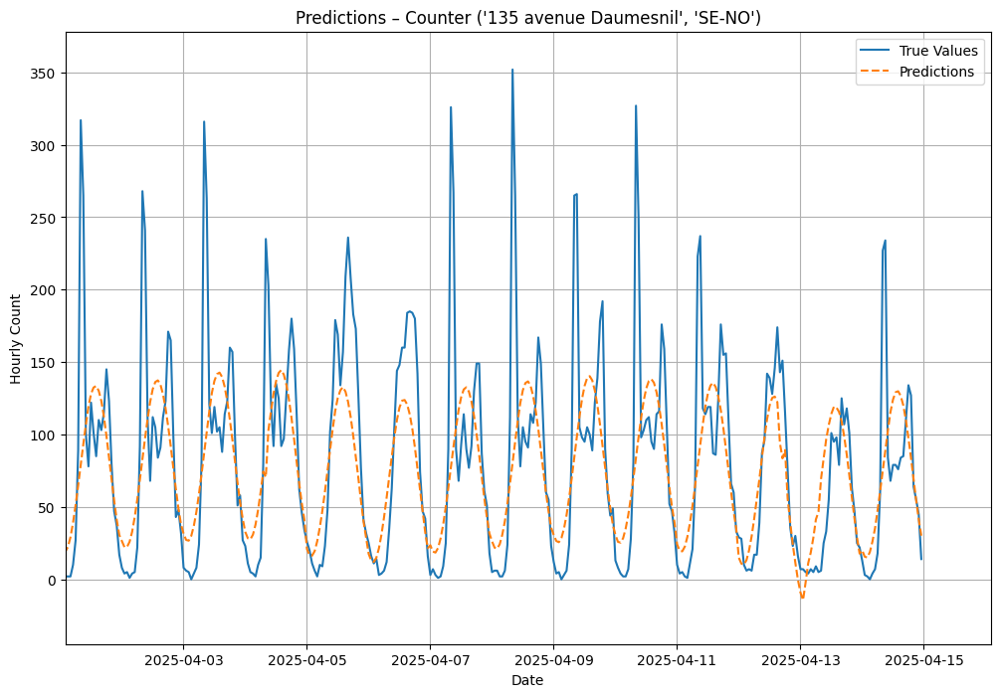

Pente de la droite de régression des résidus dans le temps (dérive) : 0.08492944561411722


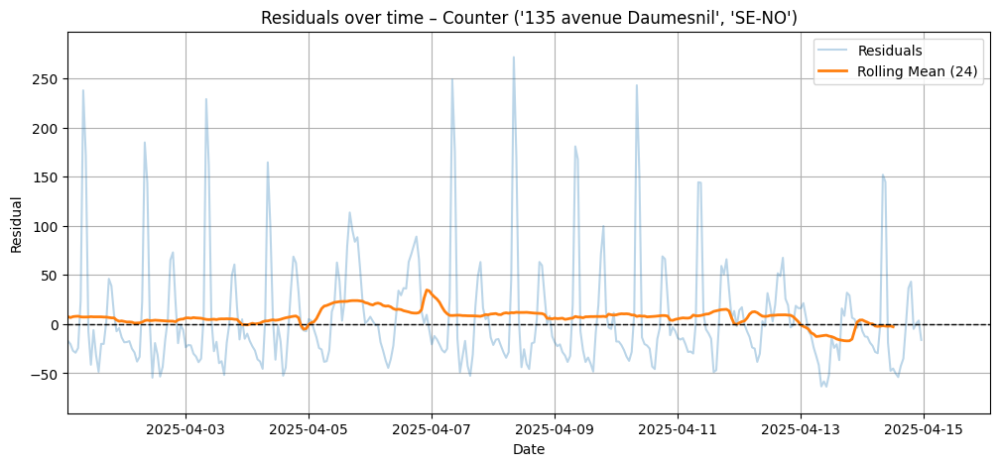

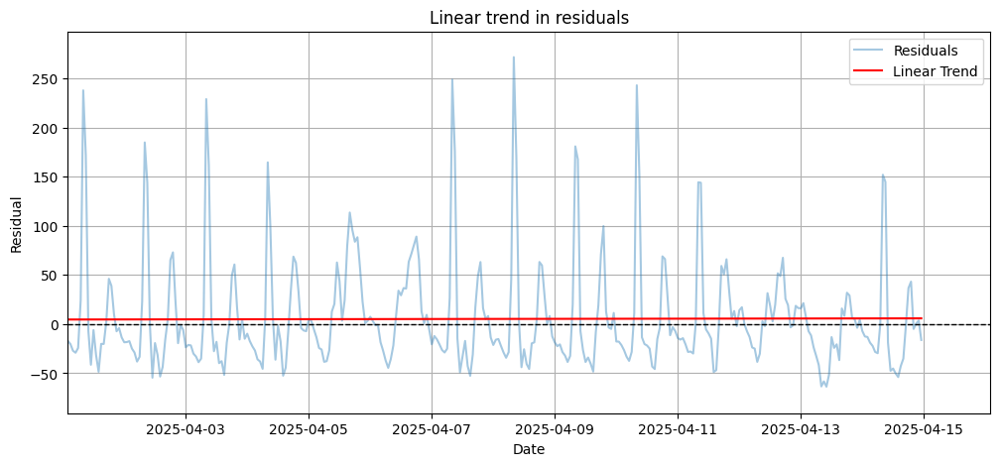

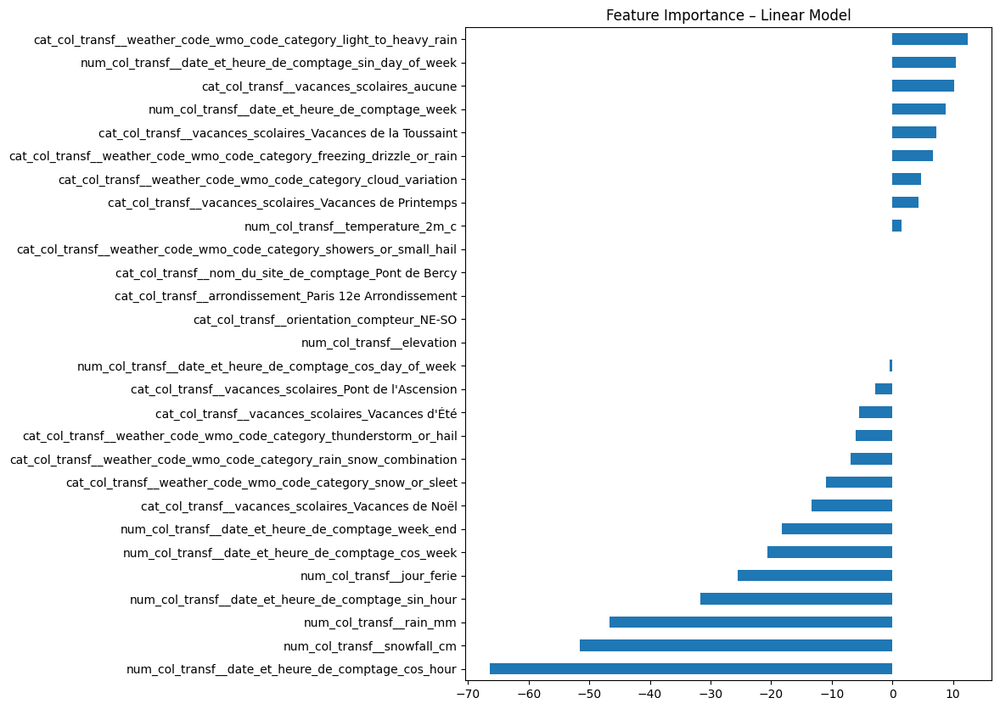


 ******************************************************************************** 
 Modèle Random Frest Regressor simple : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.9067200570772405, 'rmse': 18.944496055385077, 'mae': 13.469647599973108}


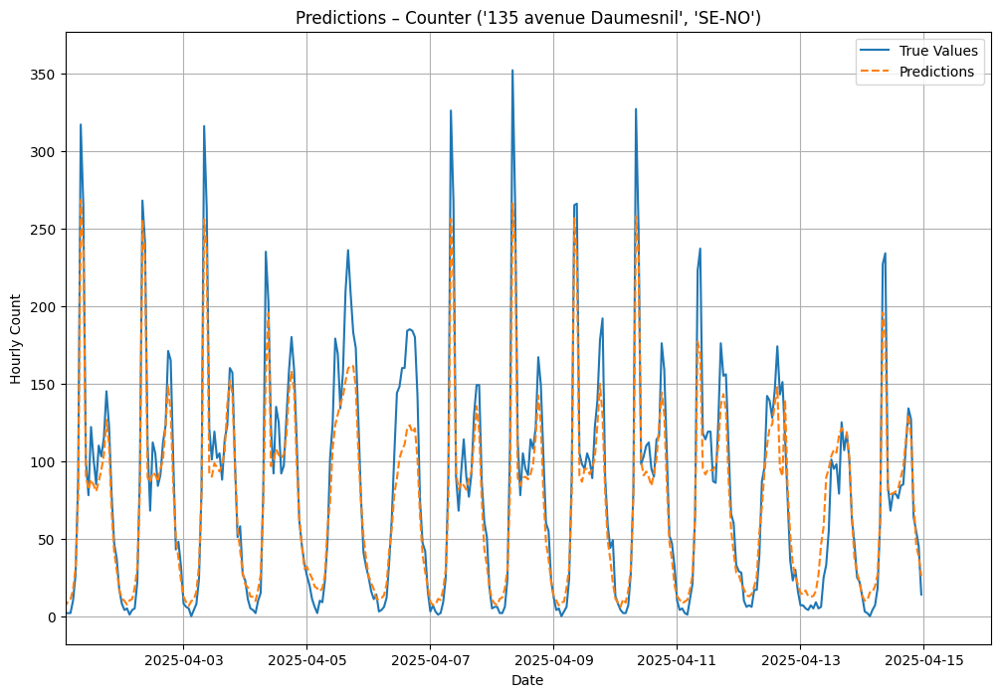

Pente de la droite de régression des résidus dans le temps (dérive) : 0.16777740608072583


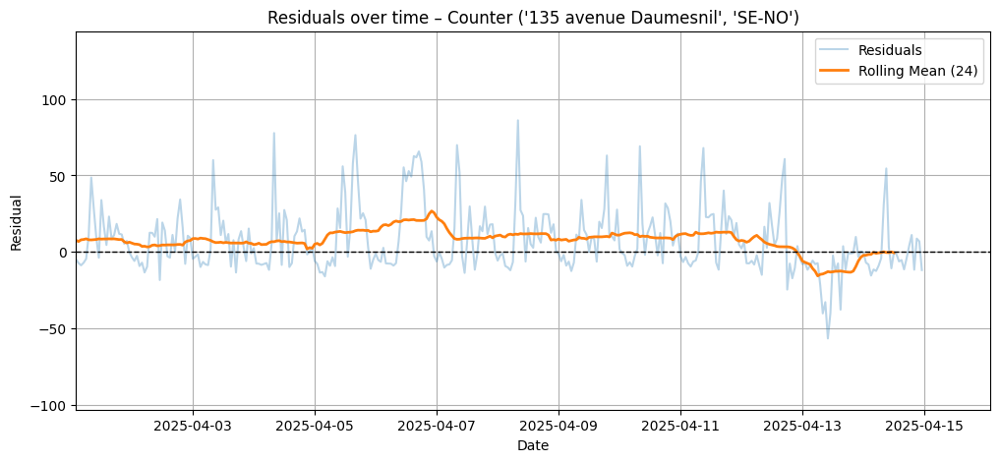

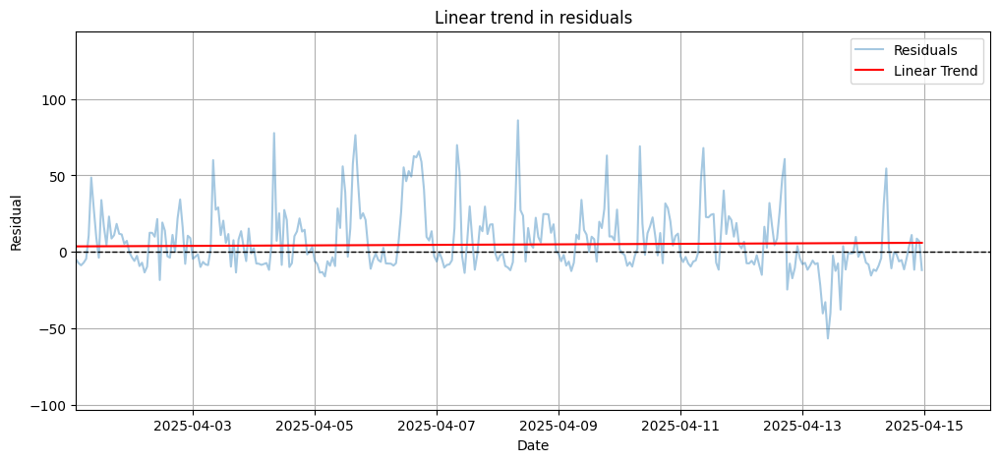


 ******************************************************************************** 
 Modèle Random Frest Regressor AR1 MM24 : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.8994624858770102, 'rmse': 19.690203307243262, 'mae': 14.133019631144062}


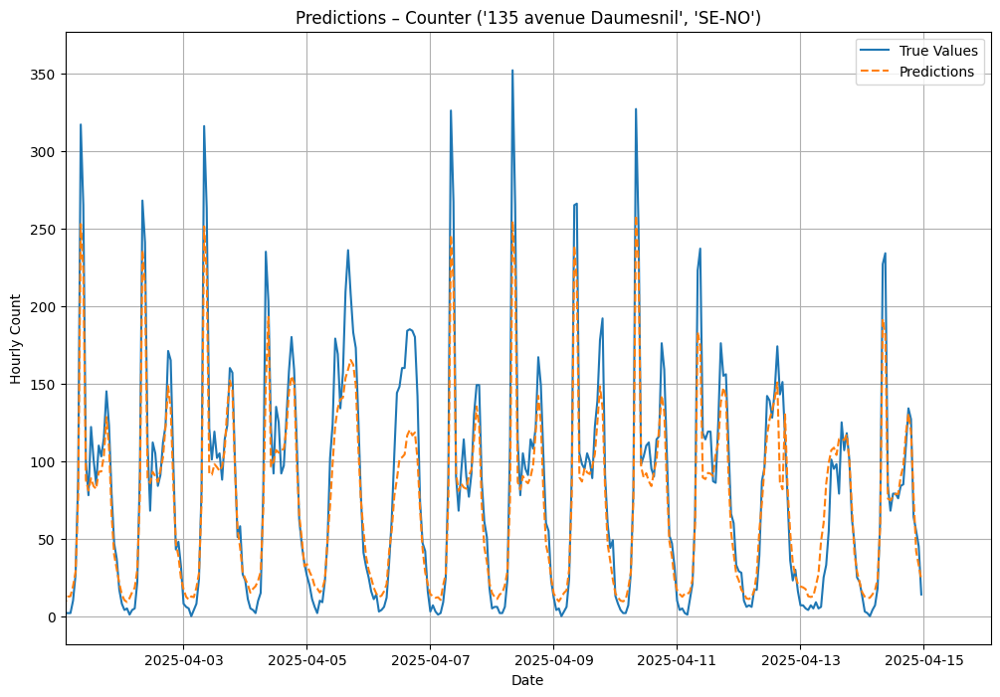

Pente de la droite de régression des résidus dans le temps (dérive) : 0.18590780088390443


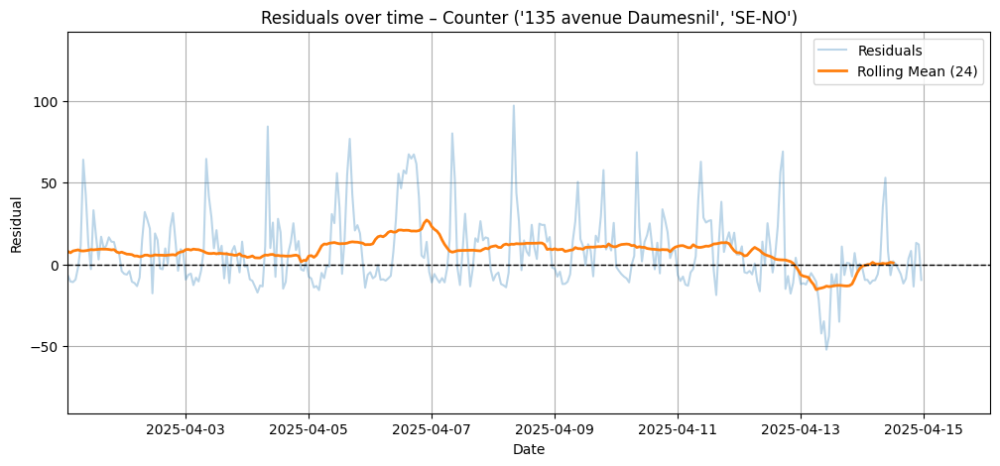

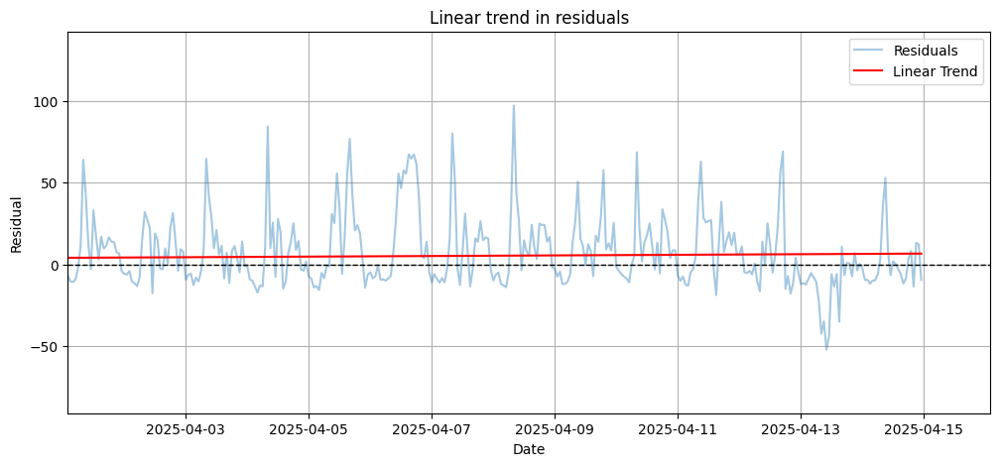


 ******************************************************************************** 
 Modèle Regression linéaire simple : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.5253702138713561, 'rmse': 28.65944703932231, 'mae': 21.21362864967576}


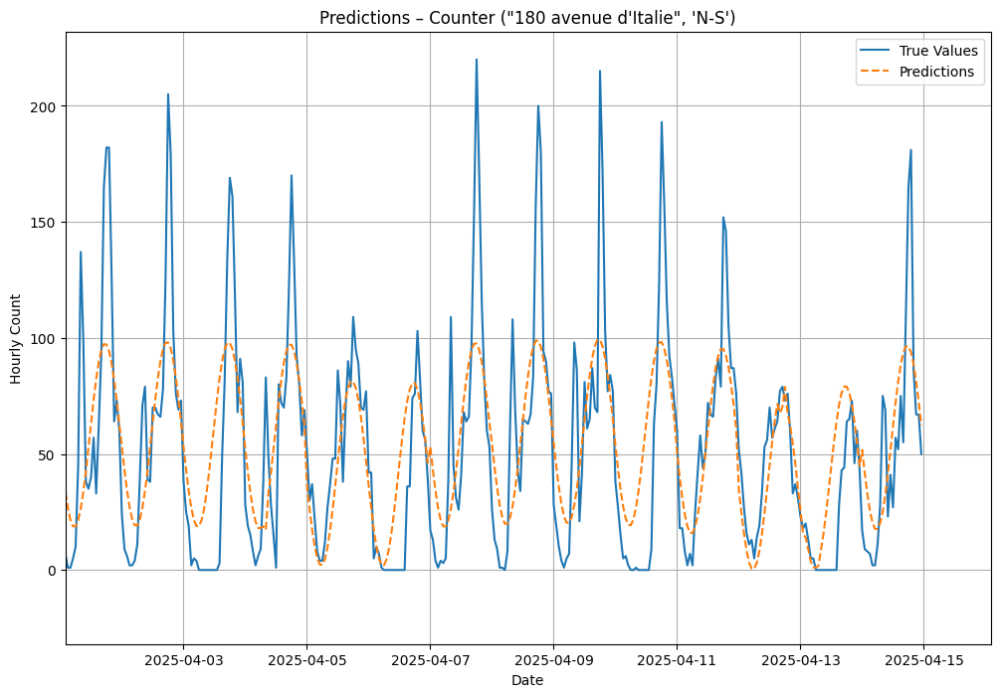

Pente de la droite de régression des résidus dans le temps (dérive) : 0.025776702207795533


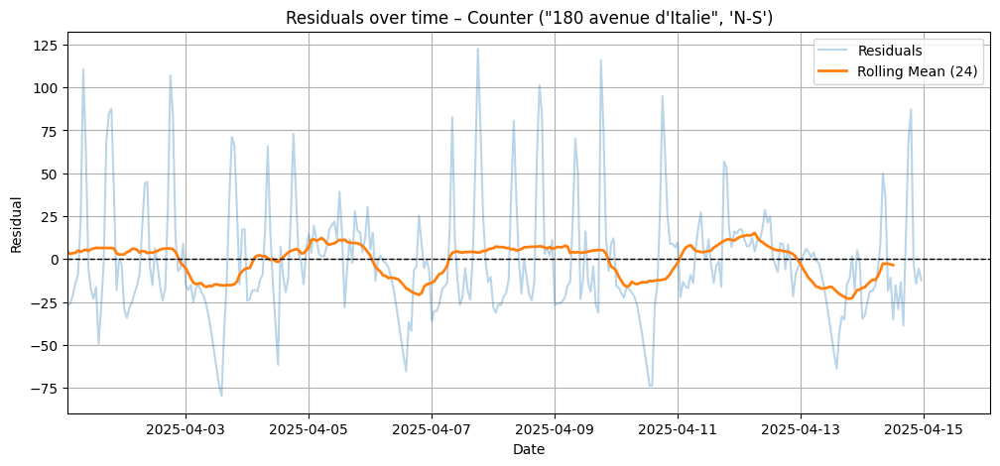

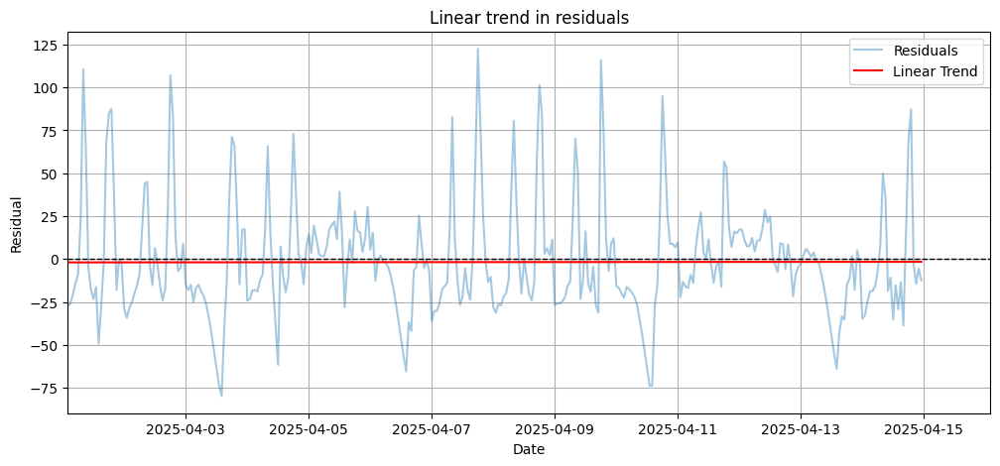

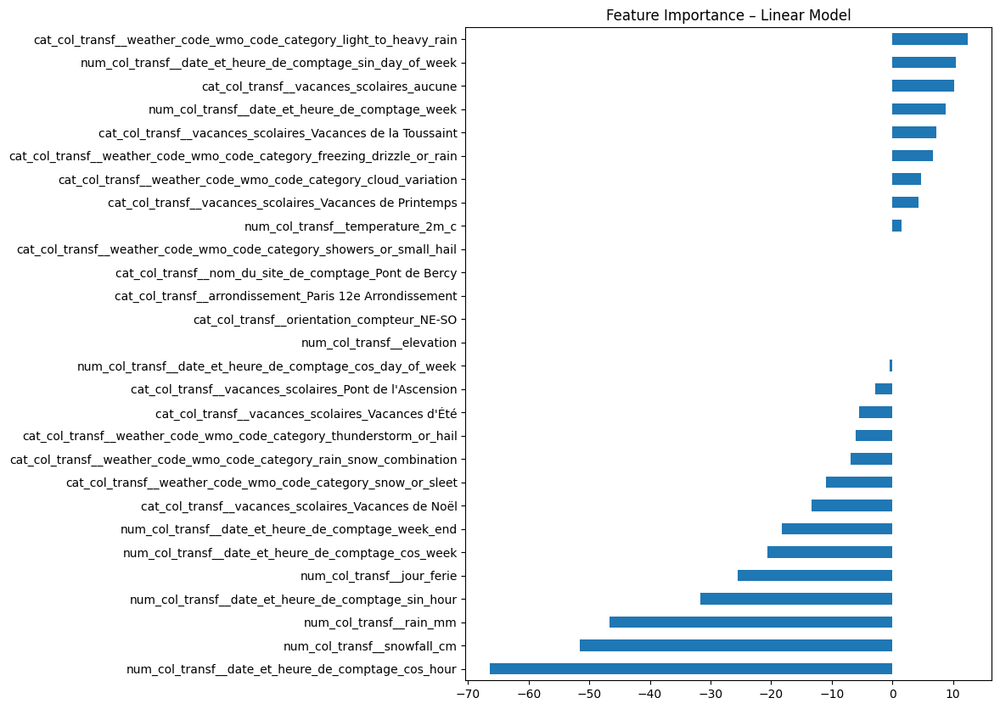


 ******************************************************************************** 
 Modèle Regression linéaire AR1 MM24 : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.5263728038681903, 'rmse': 28.565596295559192, 'mae': 21.119590857199626}


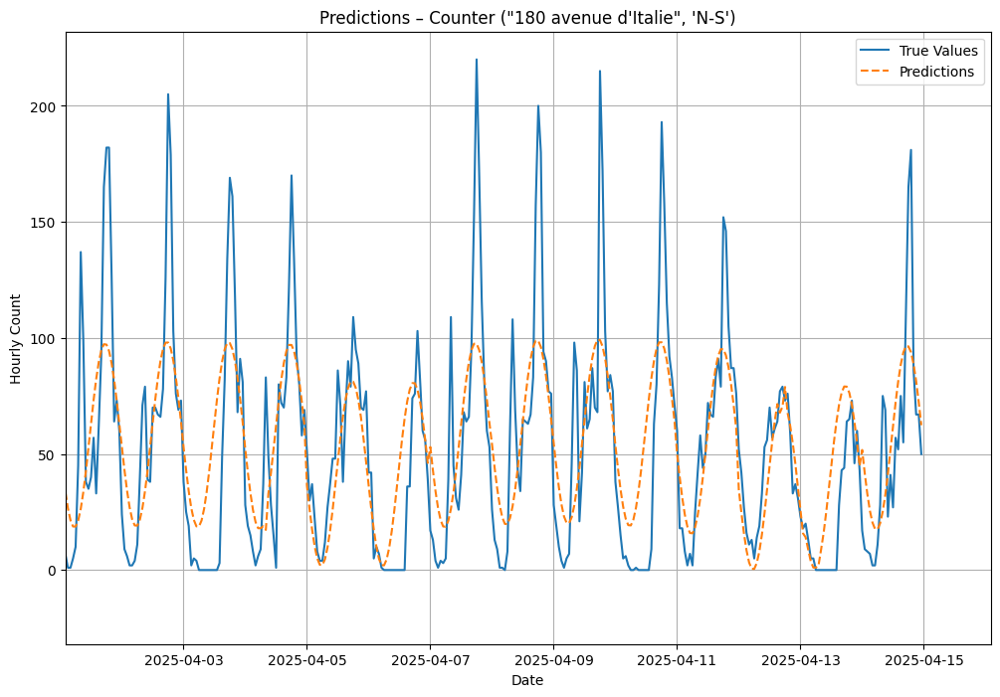

Pente de la droite de régression des résidus dans le temps (dérive) : 0.01822224677167986


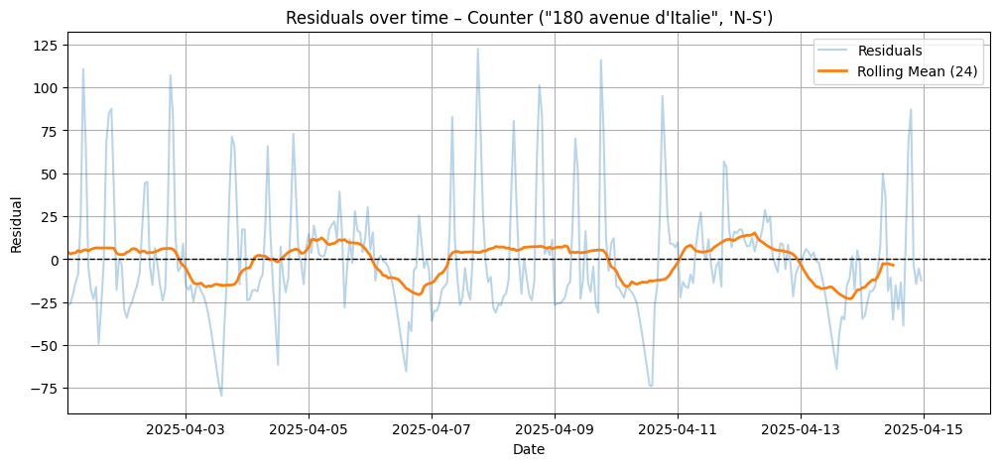

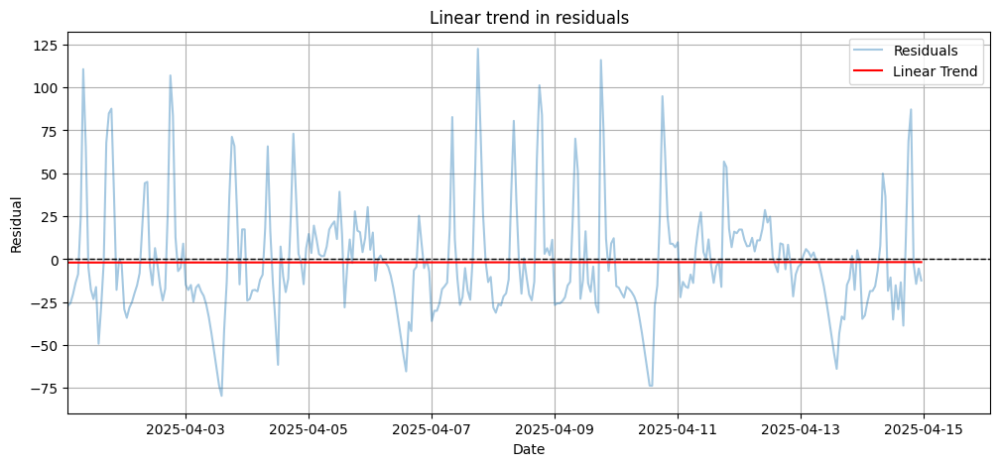

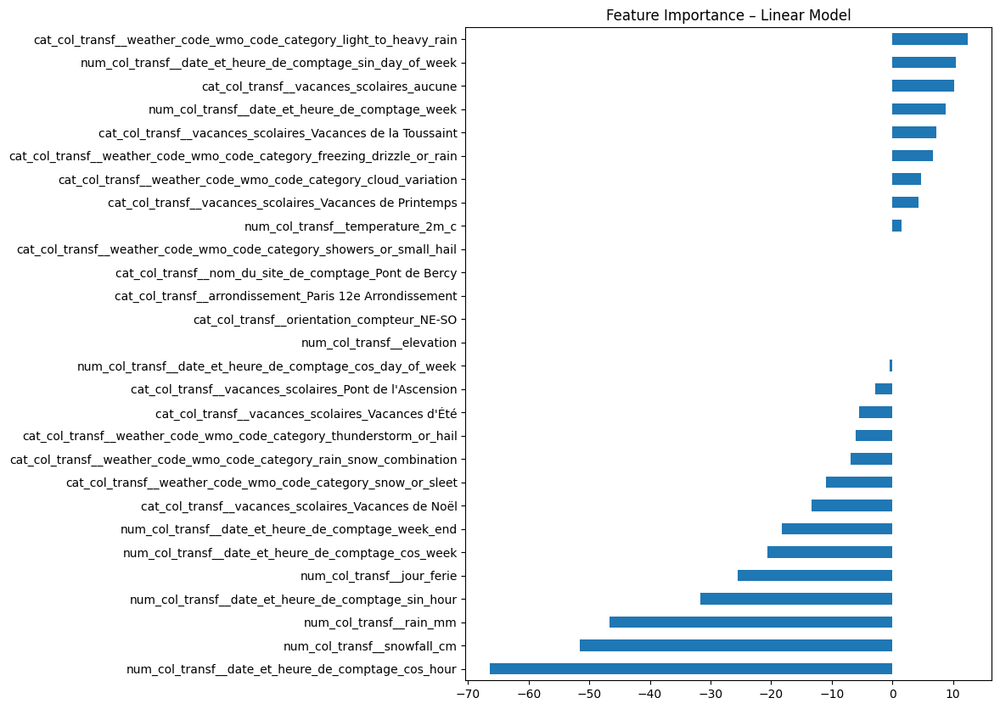


 ******************************************************************************** 
 Modèle Random Frest Regressor simple : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.8268963698068927, 'rmse': 17.30786104474518, 'mae': 12.433057646373218}


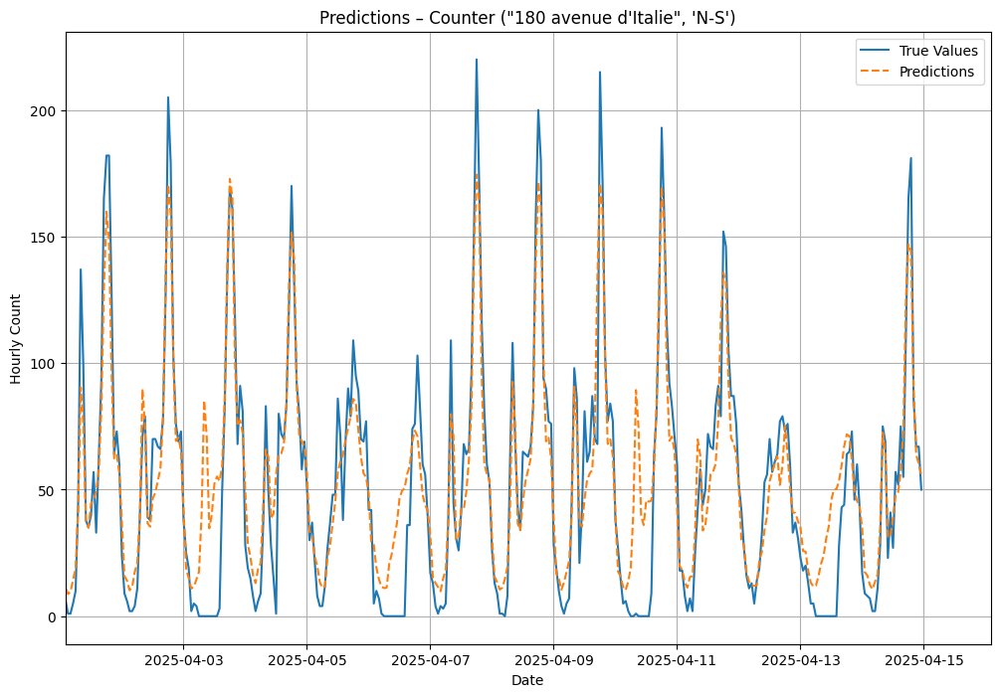

Pente de la droite de régression des résidus dans le temps (dérive) : 0.024739258962717482


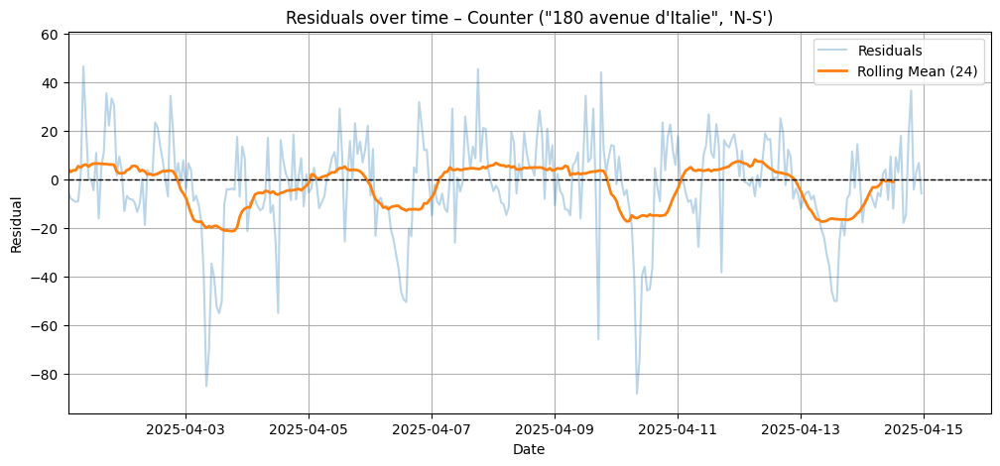

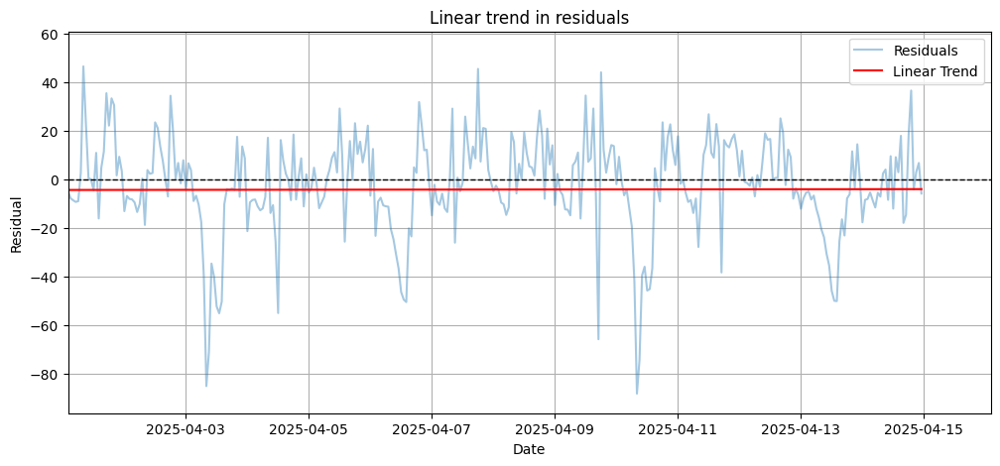


 ******************************************************************************** 
 Modèle Random Frest Regressor AR1 MM24 : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.8258242225541034, 'rmse': 17.322830544794655, 'mae': 12.613518616110586}


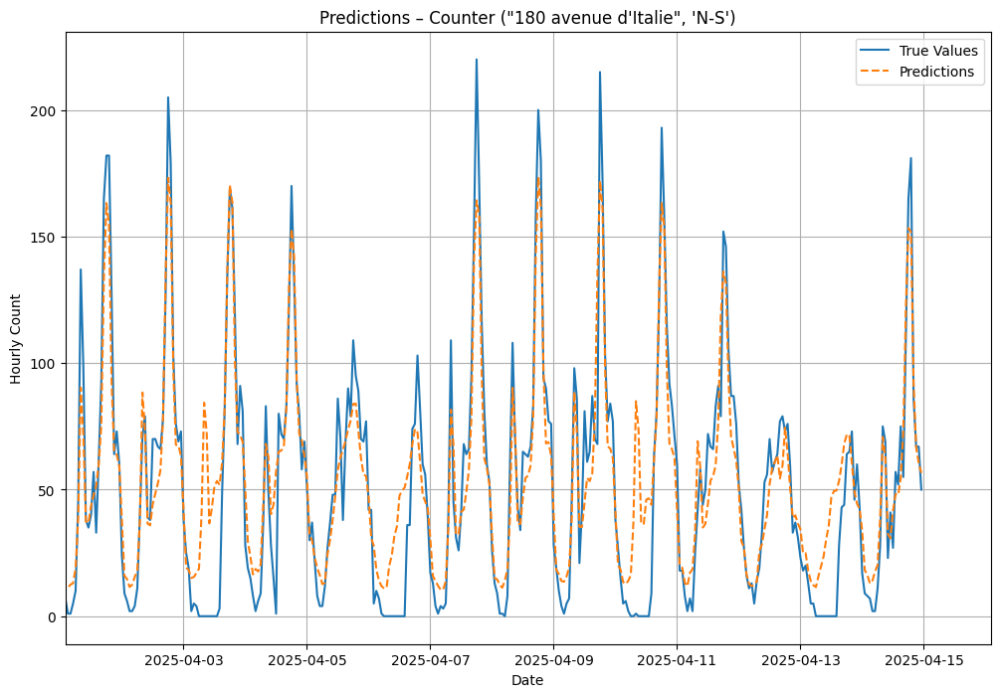

Pente de la droite de régression des résidus dans le temps (dérive) : 0.02555057868764724


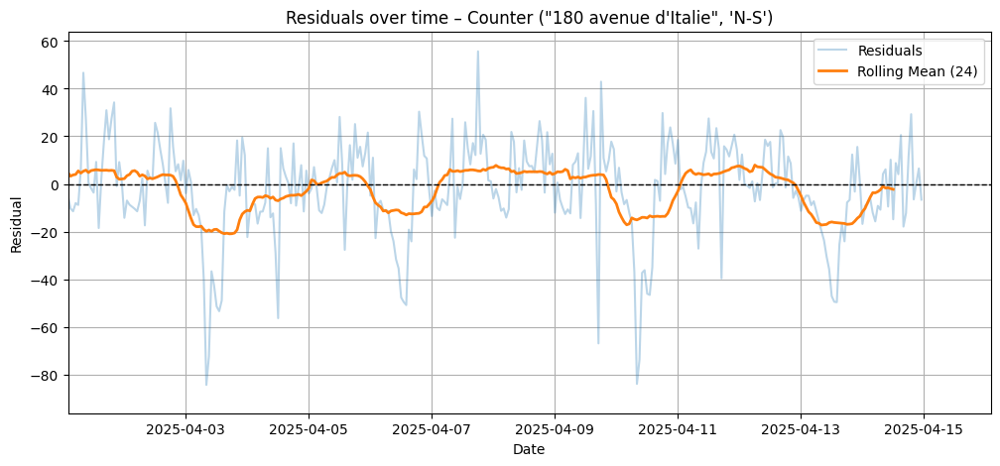

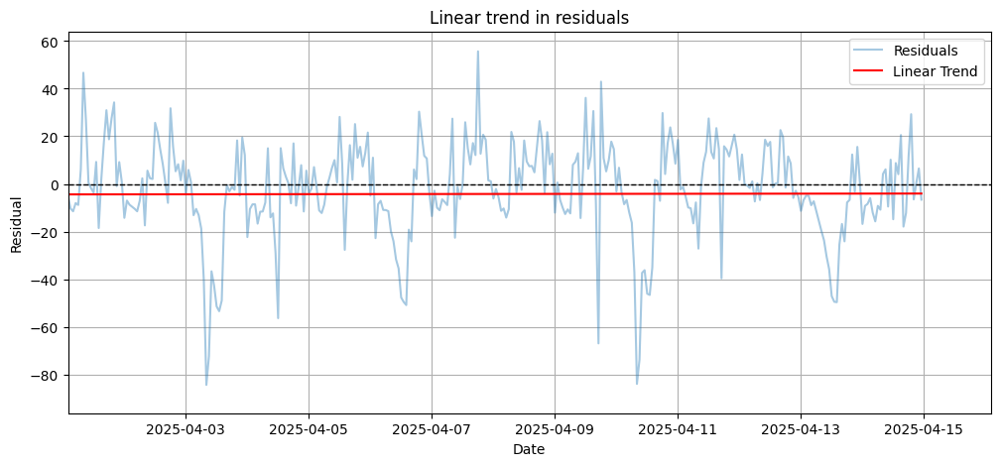


 ******************************************************************************** 
 Modèle Regression linéaire simple : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.5986895515441255, 'rmse': 53.1266014263033, 'mae': 39.11116805776962}


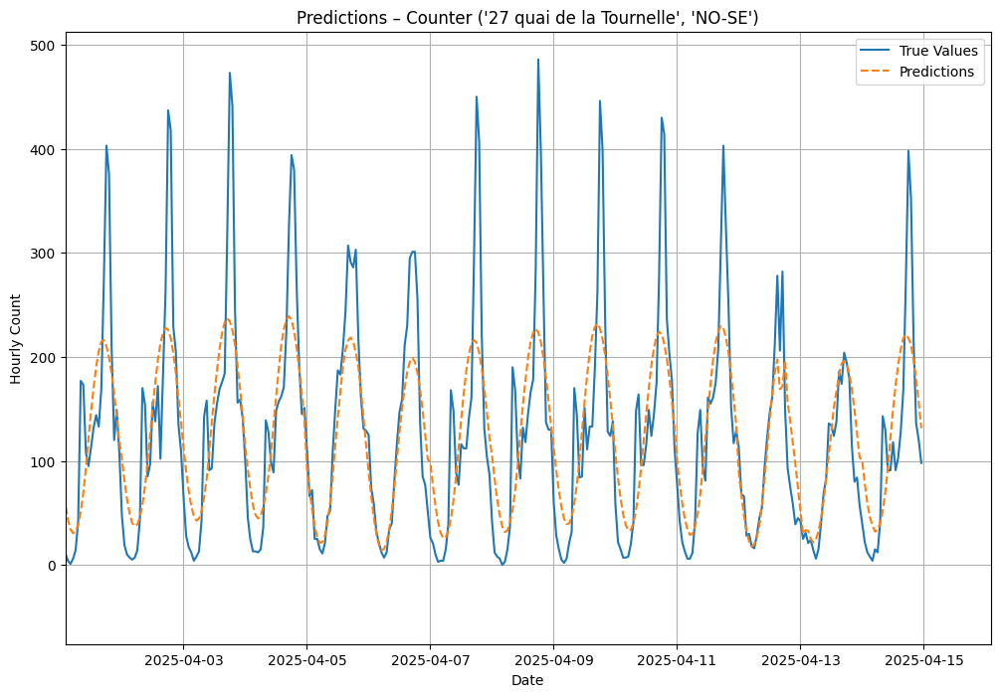

Pente de la droite de régression des résidus dans le temps (dérive) : 0.03731303403046653


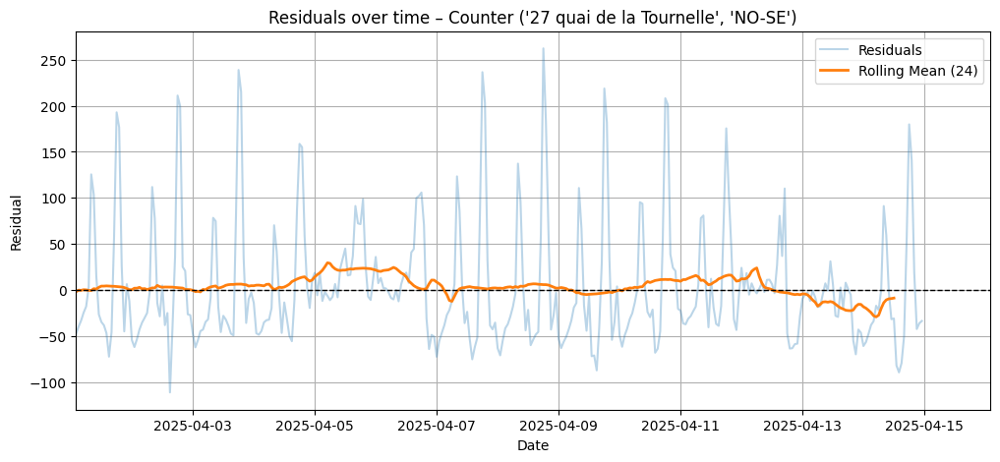

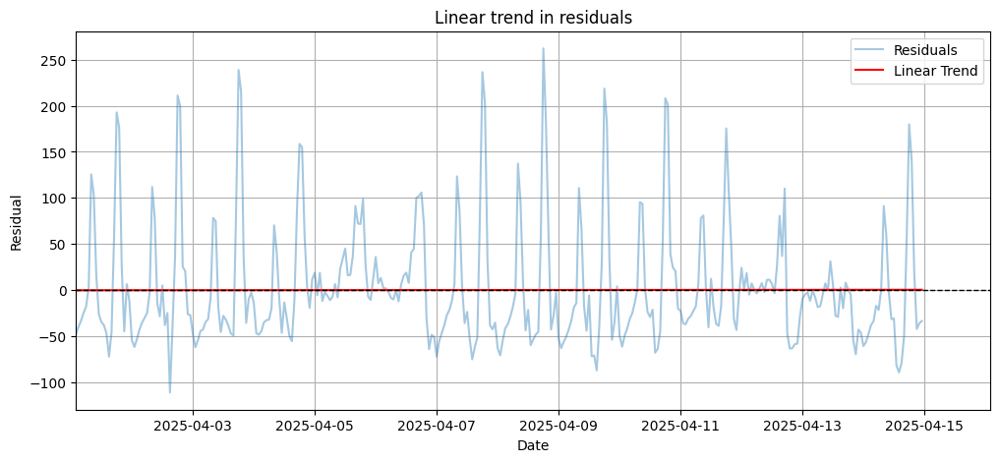

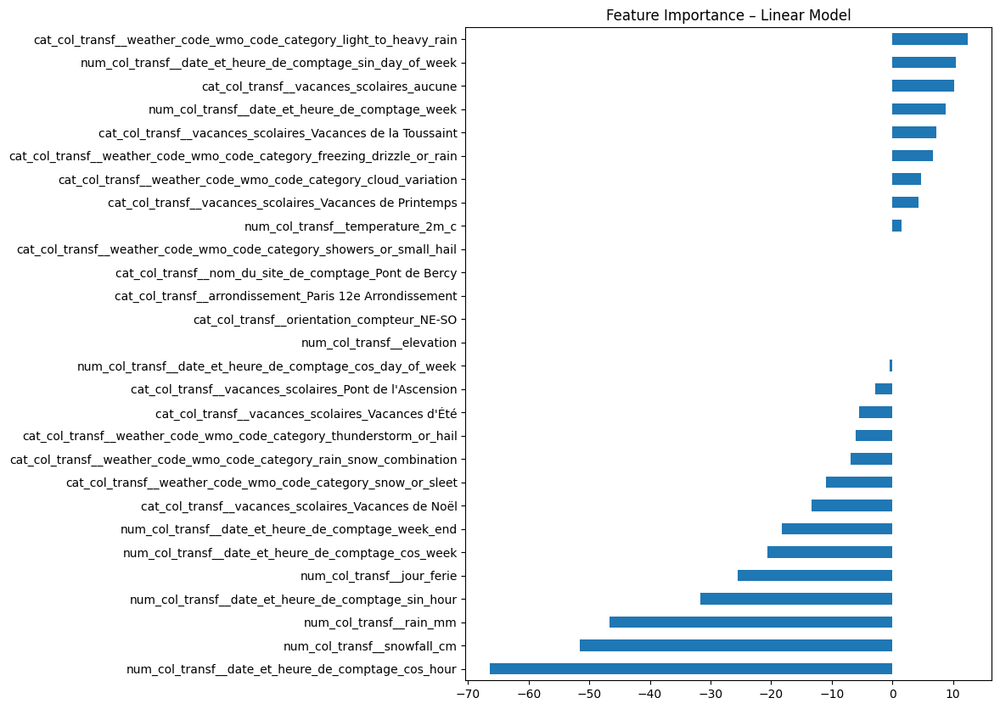


 ******************************************************************************** 
 Modèle Regression linéaire AR1 MM24 : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.5988713196052374, 'rmse': 53.181857002971405, 'mae': 39.10310308099945}


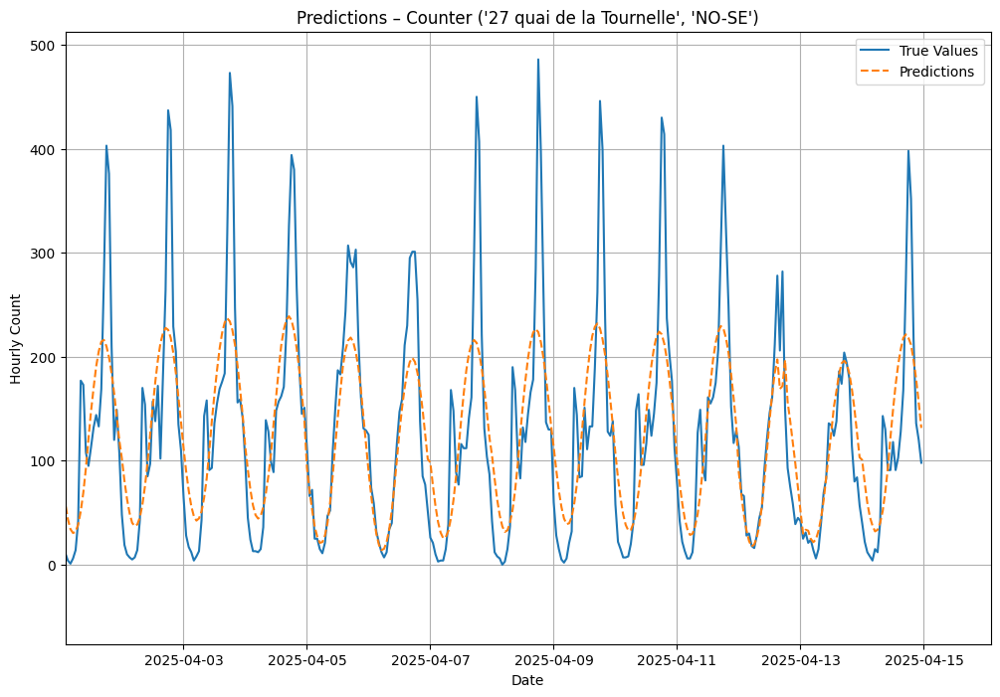

Pente de la droite de régression des résidus dans le temps (dérive) : 0.03529739955507643


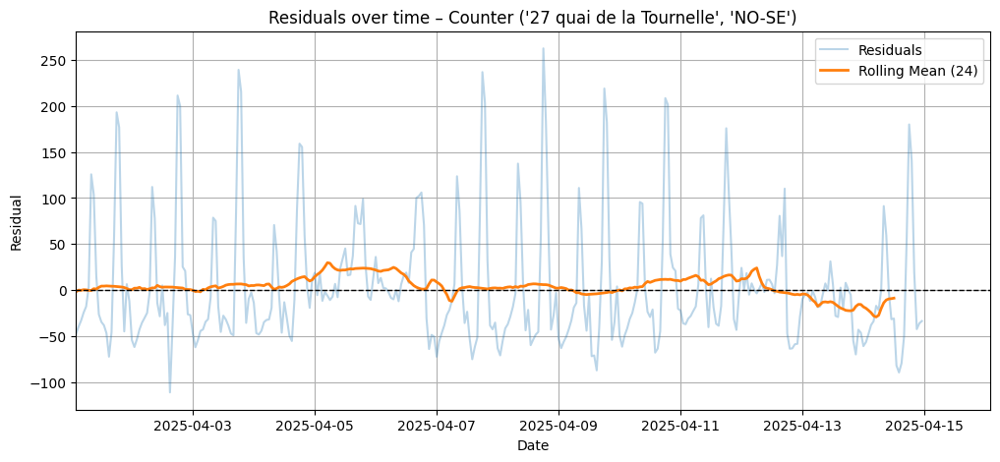

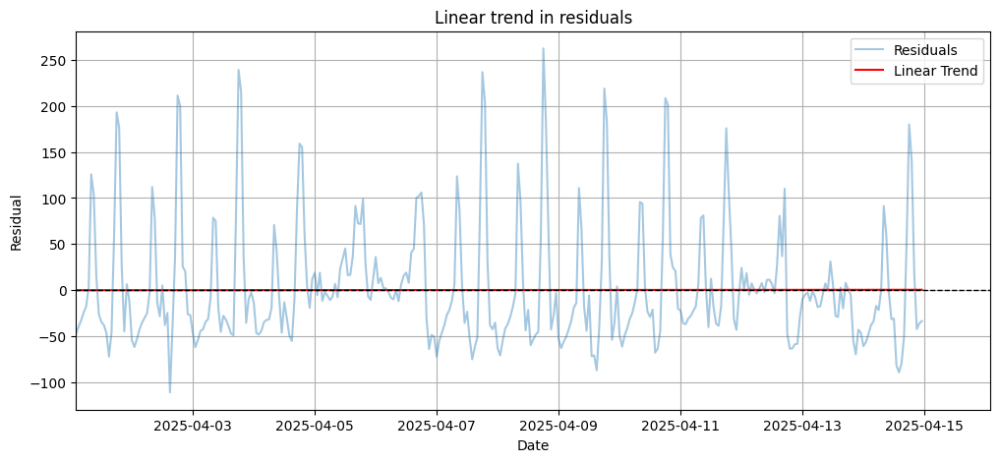

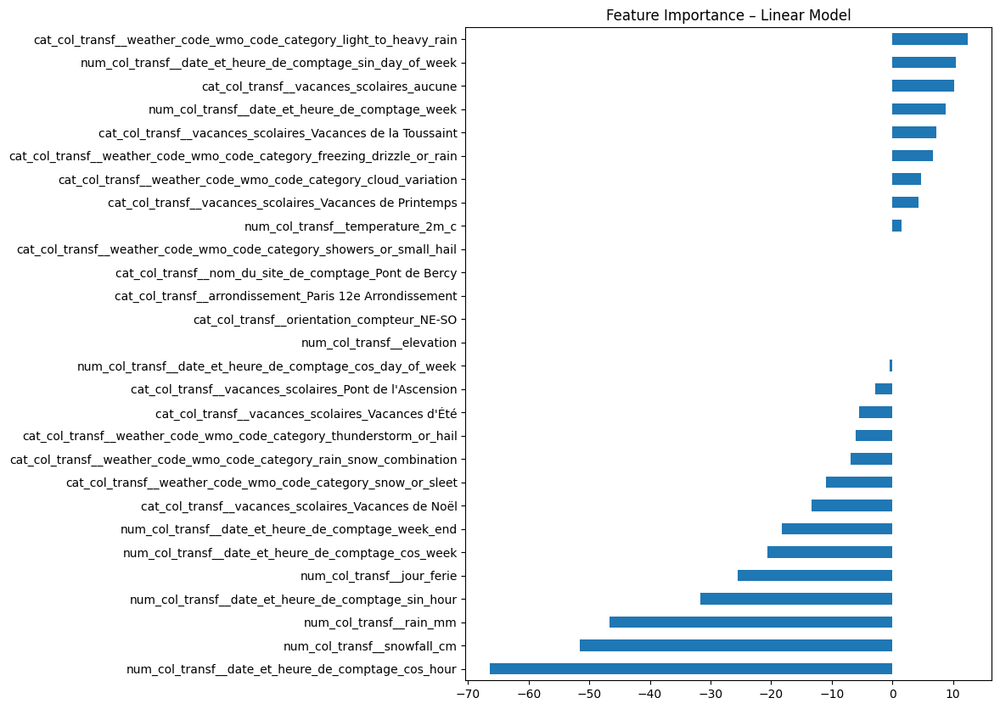


 ******************************************************************************** 
 Modèle Random Frest Regressor simple : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.9089486504950995, 'rmse': 25.305504174604796, 'mae': 19.326663868085273}


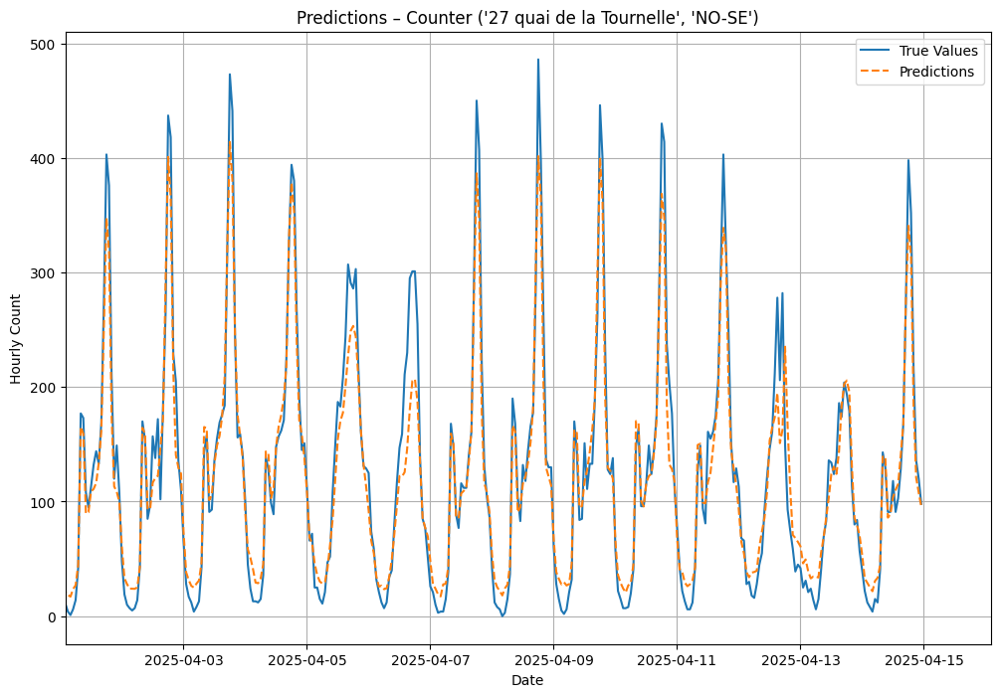

Pente de la droite de régression des résidus dans le temps (dérive) : 0.21751923123928749


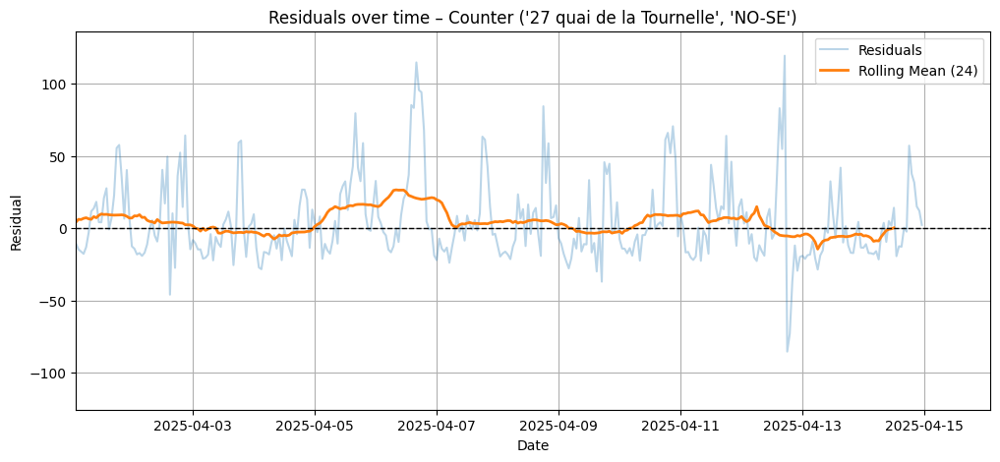

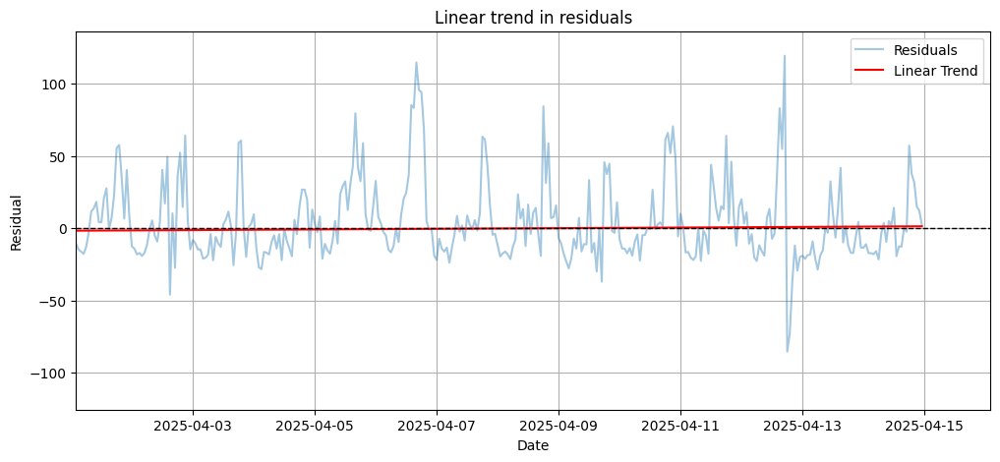


 ******************************************************************************** 
 Modèle Random Frest Regressor AR1 MM24 : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.9117971899342285, 'rmse': 24.938070671277117, 'mae': 18.9944165834025}


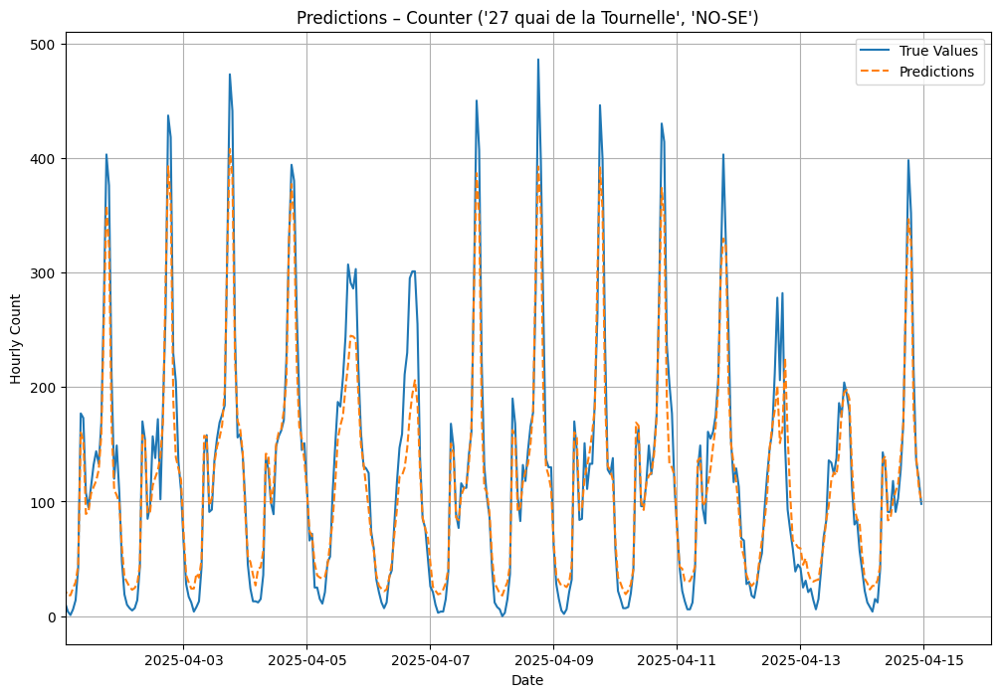

Pente de la droite de régression des résidus dans le temps (dérive) : 0.2375988978500465


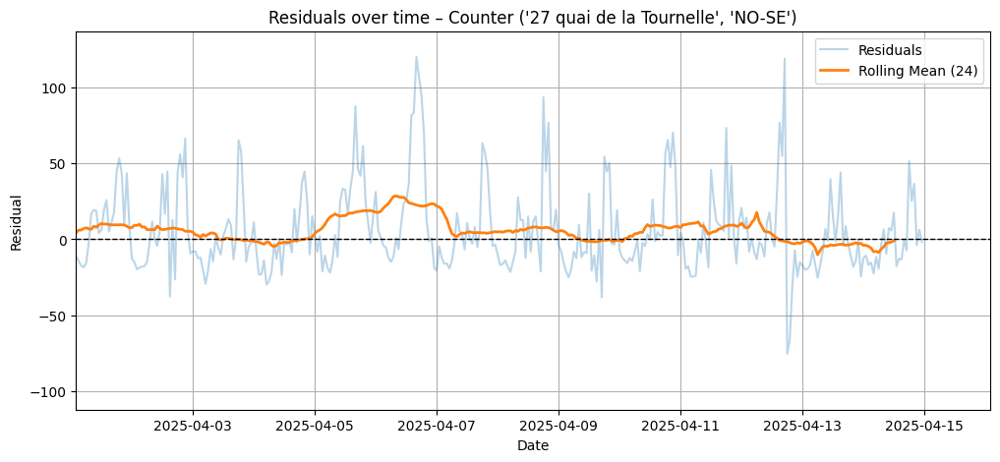

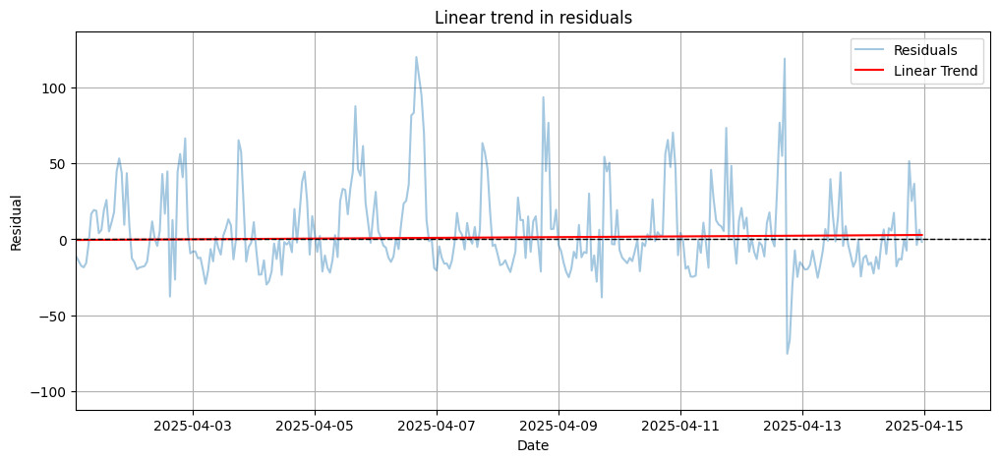


 ******************************************************************************** 
 Modèle Regression linéaire simple : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.4115353514103083, 'rmse': 111.34438470960275, 'mae': 74.45372915971774}


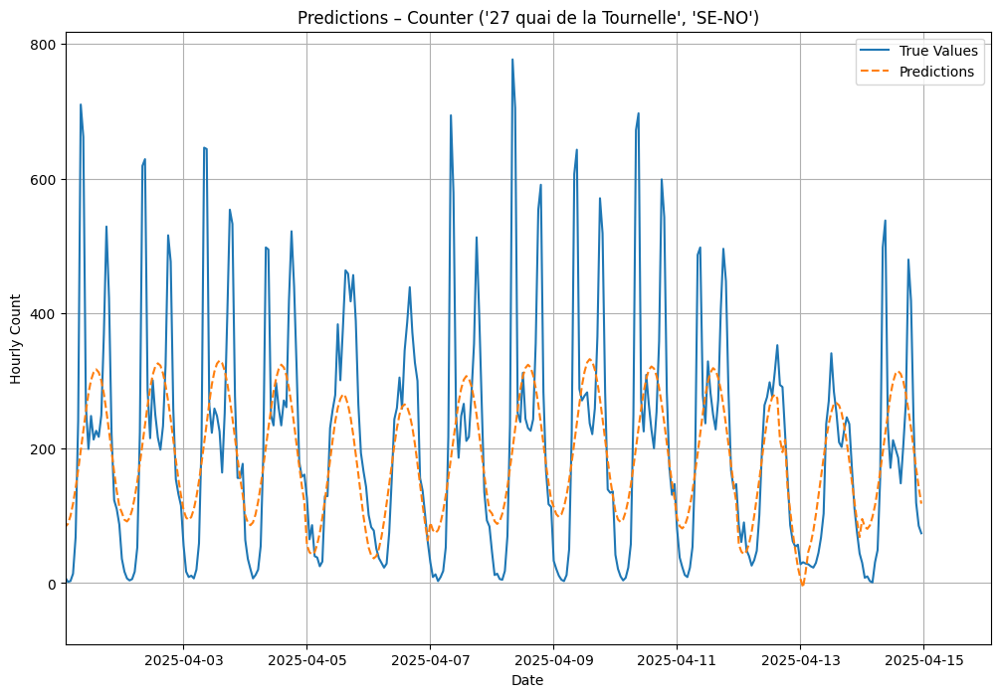

Pente de la droite de régression des résidus dans le temps (dérive) : 0.3236745268686401


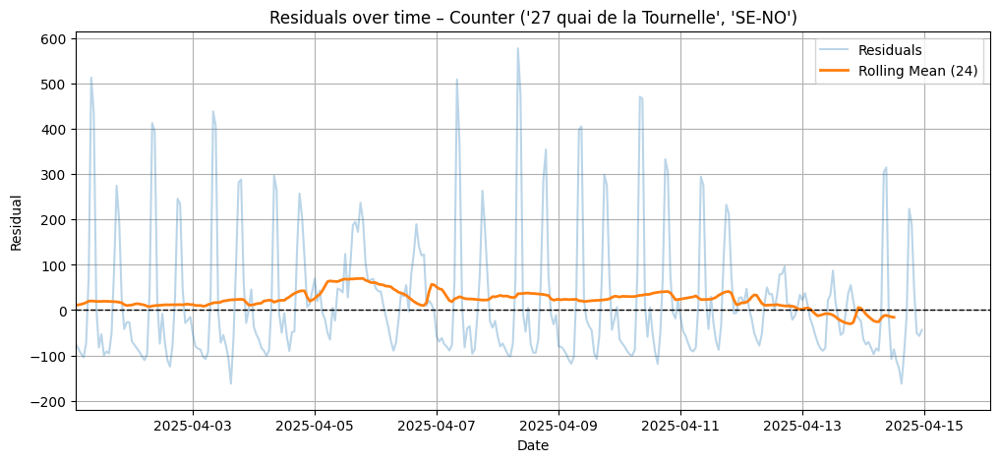

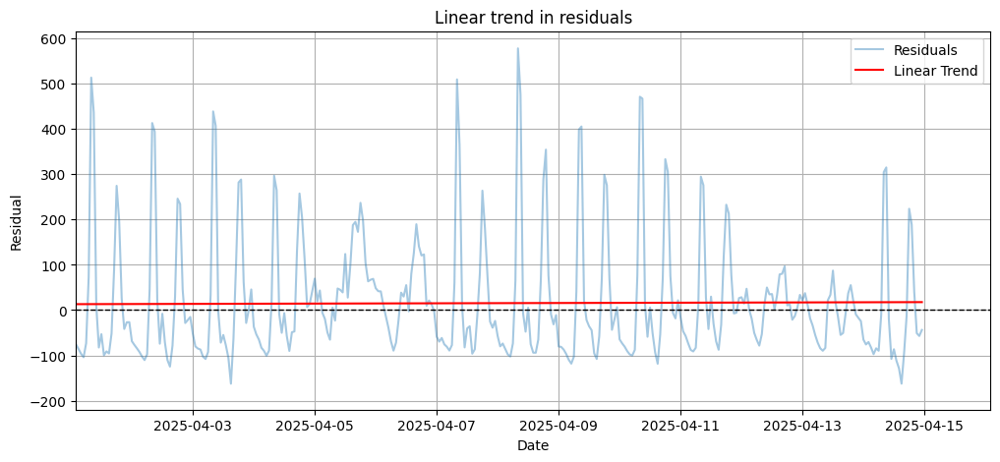

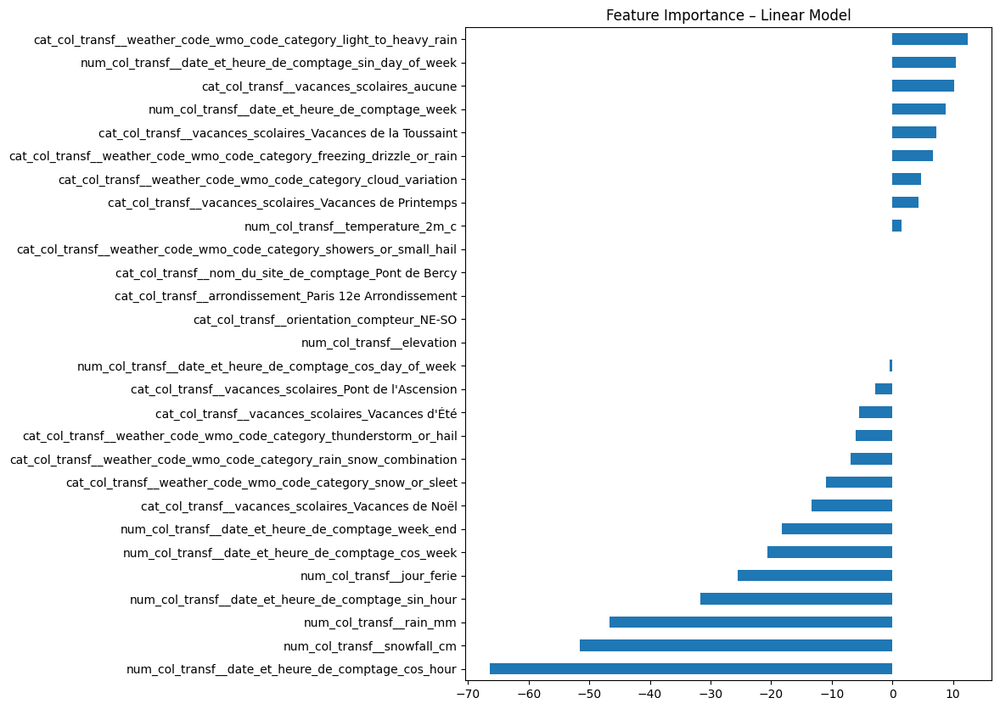


 ******************************************************************************** 
 Modèle Regression linéaire AR1 MM24 : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.4127257767724116, 'rmse': 111.2384142885215, 'mae': 74.2472143795177}


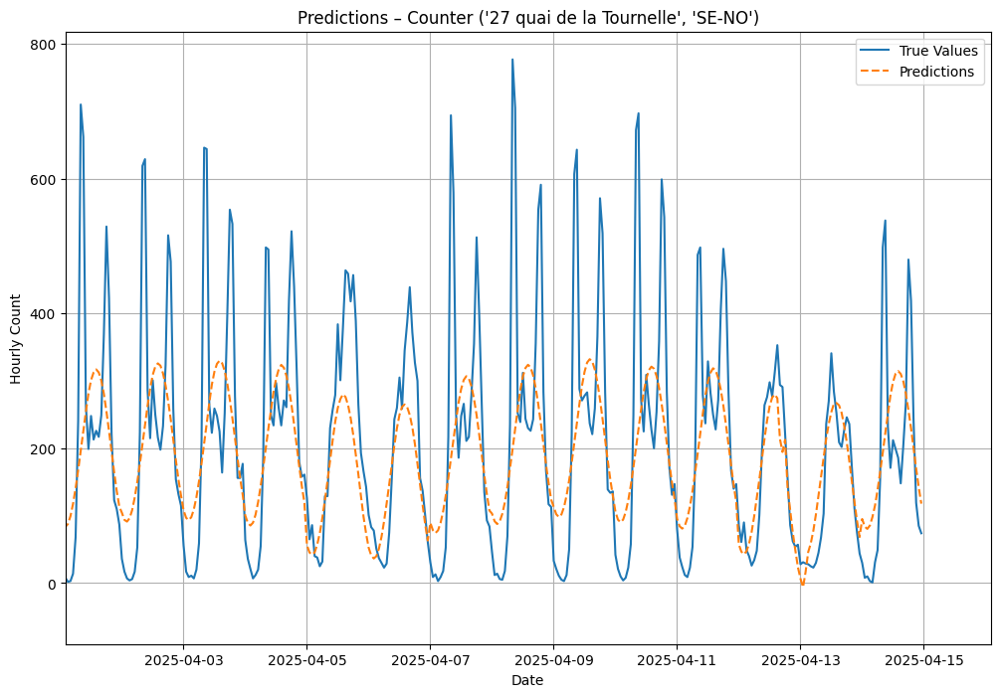

Pente de la droite de régression des résidus dans le temps (dérive) : 0.329175440718793


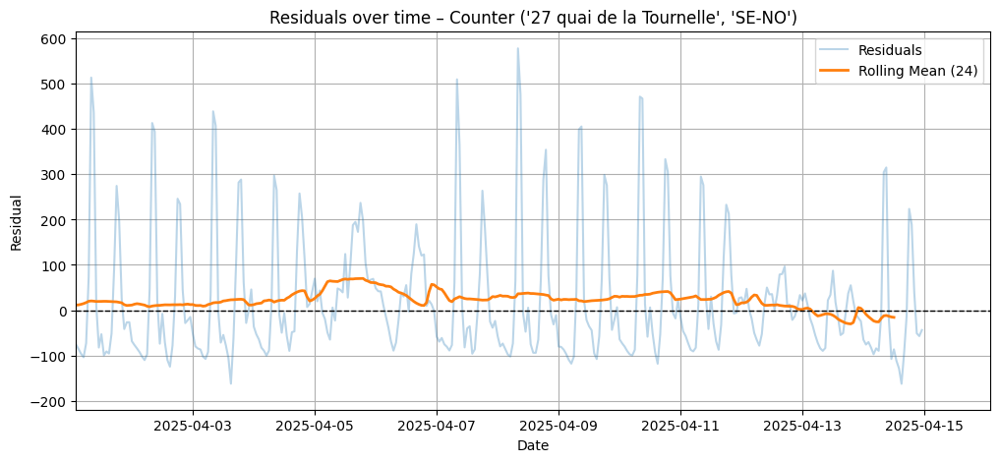

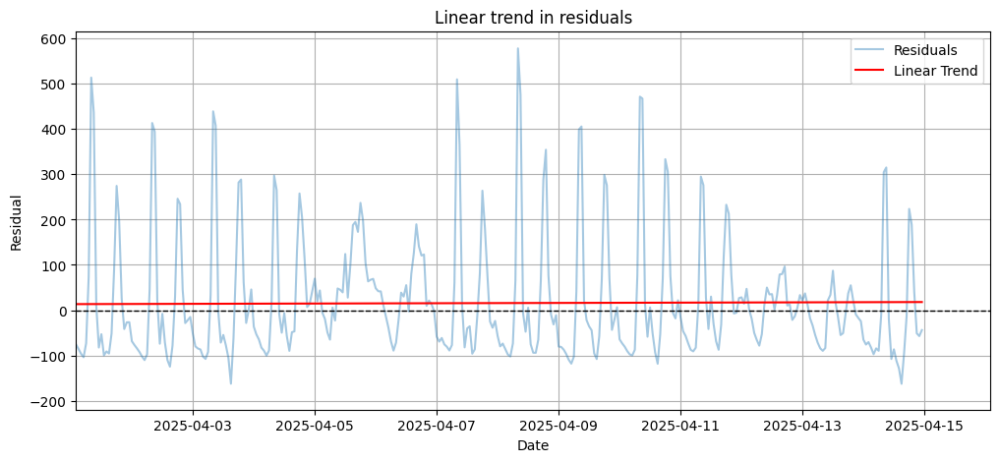

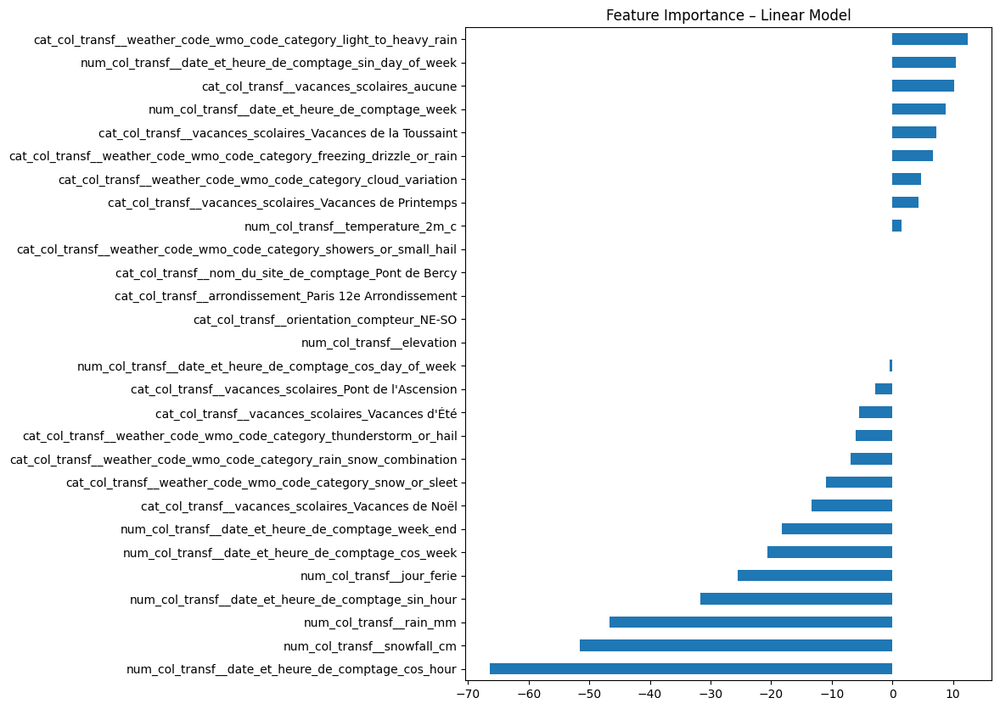


 ******************************************************************************** 
 Modèle Random Frest Regressor simple : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.9212610737533844, 'rmse': 40.72891817177274, 'mae': 30.574121438262022}


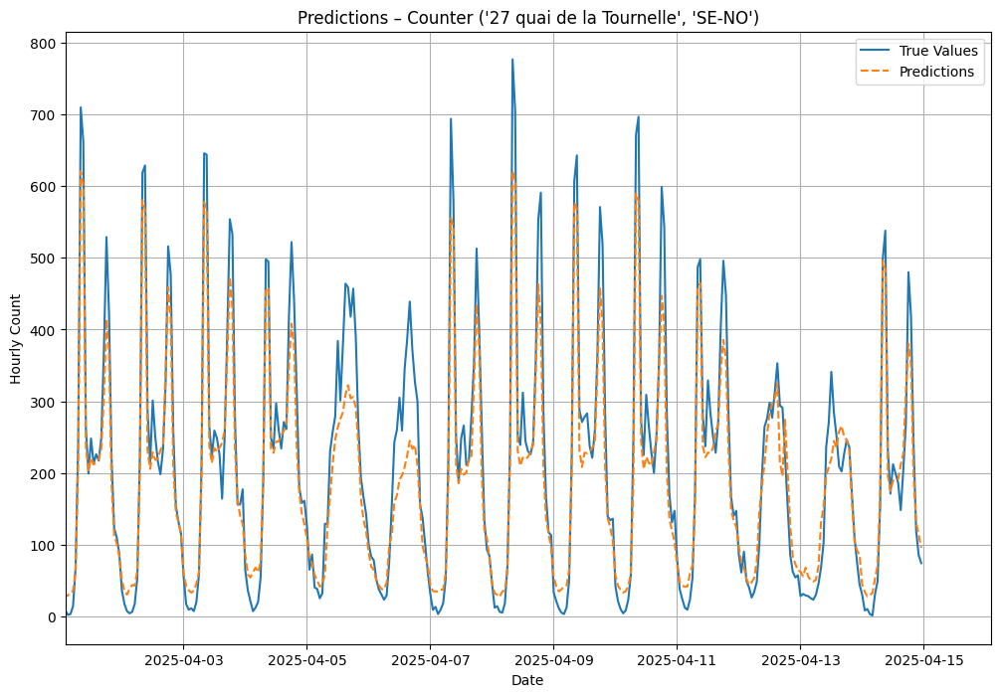

Pente de la droite de régression des résidus dans le temps (dérive) : 0.5312792721781916


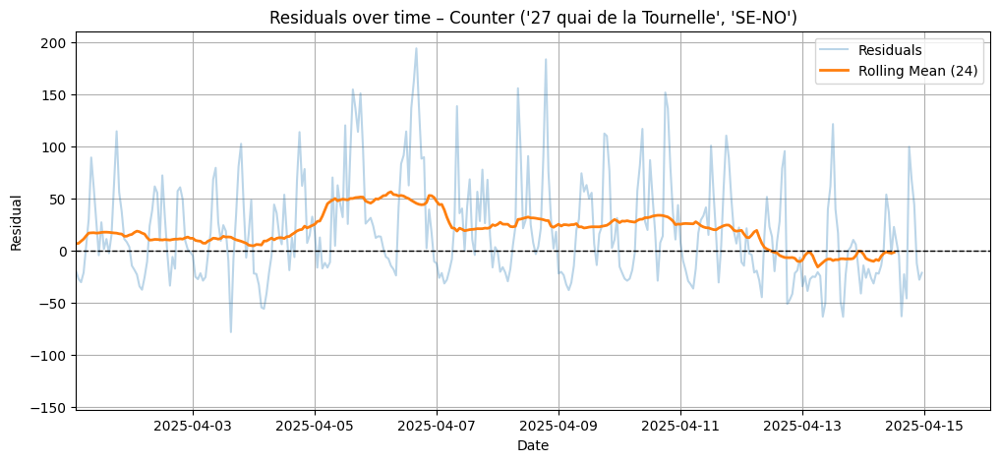

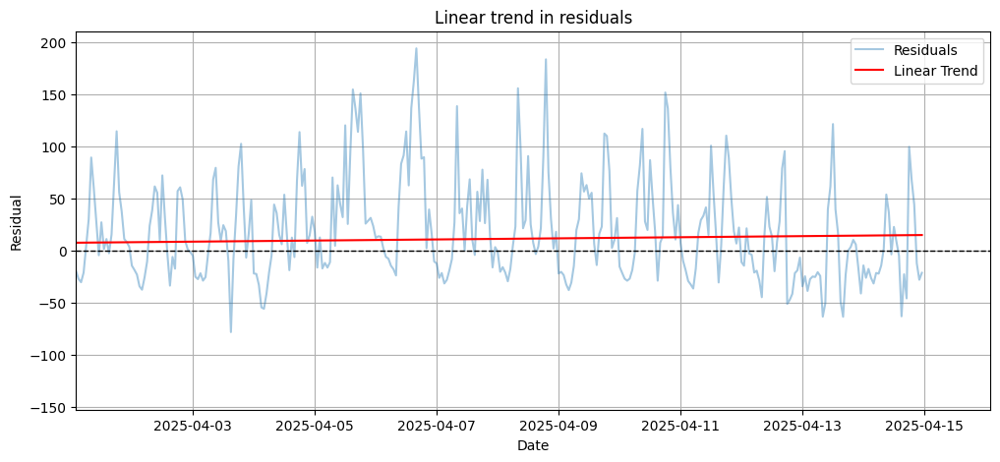


 ******************************************************************************** 
 Modèle Random Frest Regressor AR1 MM24 : 
 ******************************************************************************** 

Metriques du modèle: {'r2': 0.9168447338511004, 'rmse': 41.858069885002664, 'mae': 31.395230552243433}


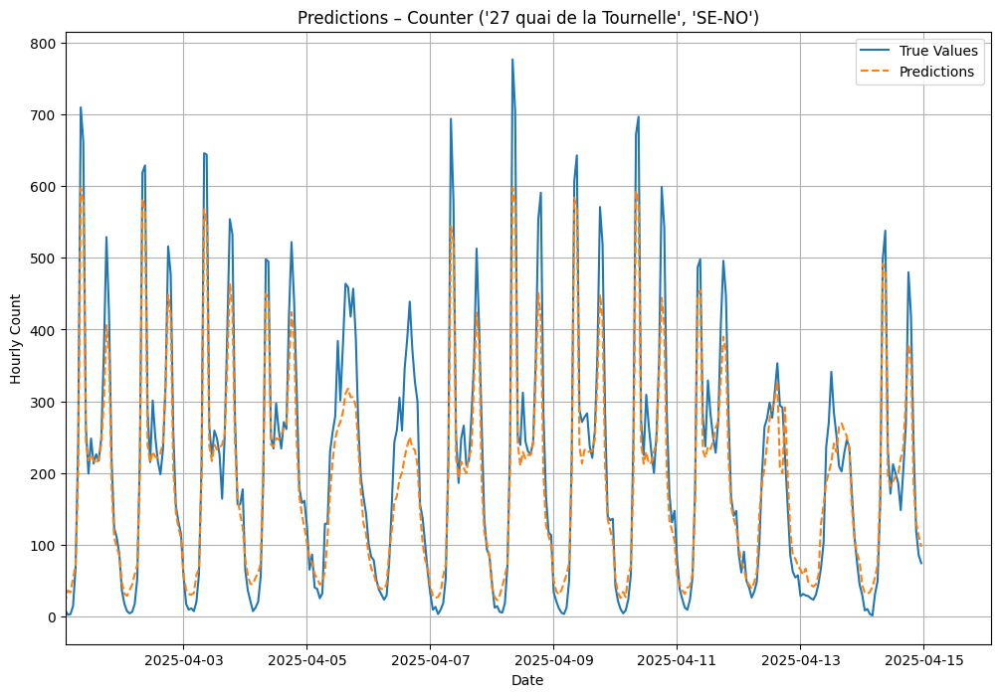

Pente de la droite de régression des résidus dans le temps (dérive) : 0.5653440681373103


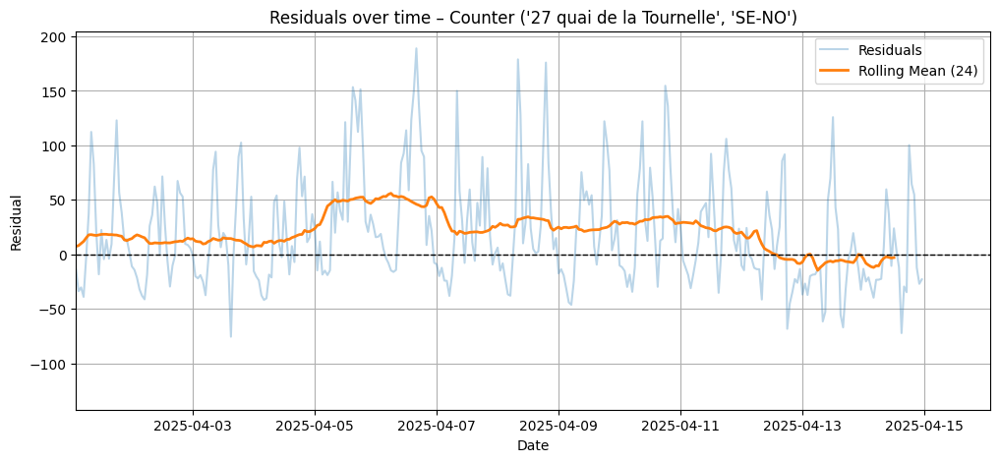

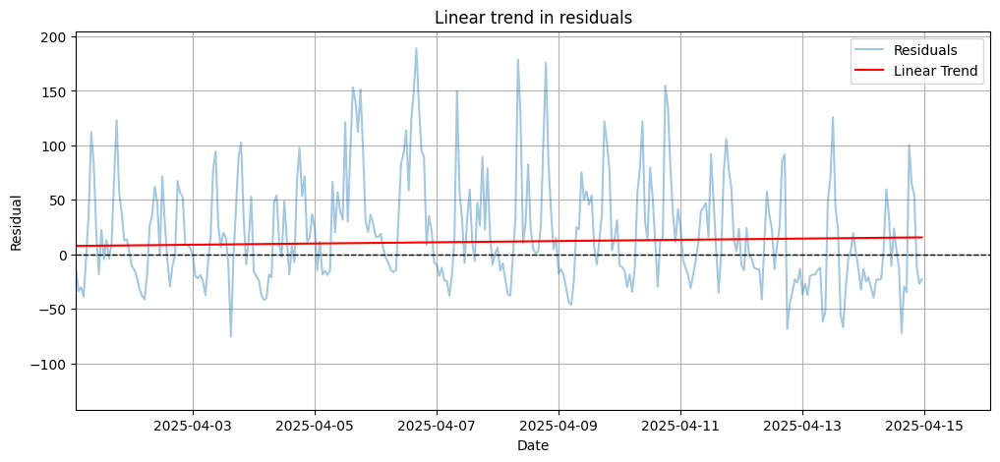

In [20]:
# Afficher une modélisation de compteur spécifique

liste_model_results = {
    "Regression linéaire simple":models_lr_simple_results,
    "Regression linéaire AR1 MM24":models_lr_ar1ma24_results,
    "Random Frest Regressor simple":models_rfr_simple_results,
    "Random Frest Regressor AR1 MM24":models_rfr_ar1ma24_results,
}
for compteur, (model_name, model_results) in itertools.product(liste_compteurs, liste_model_results.items()):
    print("\n", "*"*80, "\n", f"Modèle {model_name} :","\n", "*"*80, "\n")
    model_metrics = mps.compute_metrics(
        model_results[compteur]["y_test"],
        model_results[compteur]["y_test_pred"]
    )
    print("Metriques du modèle:",model_metrics)

    fig_pred = mps.plot_predictions(
        str(compteur),
        model_results[compteur]["X_test_dates"], 
        model_results[compteur]["y_test"], 
        model_results[compteur]["y_test_pred"], 
        periode_limite=('2025-04-01', '2025-04-16')
    )
    plt.show()

    fig1_res, fig2_res, model_res_coeff = mps.compute_residuals_plot(
        str(compteur),
        model_results[compteur]["X_test_dates"], 
        model_results[compteur]["y_test"], 
        model_results[compteur]["y_test_pred"], 
        periode_limite=('2025-04-01', '2025-04-16')
    )
    print("Pente de la droite de régression des résidus dans le temps (dérive) :", model_res_coeff)
    plt.show()

    fig_interp_list = mps.interpret_model(
        str(compteur), 
        model_results[compteur]
    )
    plt.show()

## Optimisation GridSearchCV - Ridge

In [21]:
from sklearn.model_selection import train_test_split

colonnes_a_exclure = [
    'Unnamed: 0', 'identifiant_du_compteur', 'nom_du_site_de_comptage',
    'orientation_compteur', 'arrondissement',
    'vacances_scolaires', 'weather_code_wmo_code_category'
]

X_train_dict = {}
y_train_dict = {}

compteurs_utiles = ['Pont de Bercy', '135 avenue Daumesnil', "180 avenue d'Italie", '27 quai de la Tournelle']

for compteur in compteurs_utiles:
    data = df[df['nom_du_site_de_comptage'] == compteur].copy()

    # Sécurité : conversion de la date et création de variables utiles
    if 'date_et_heure_de_comptage' in data.columns:
        data['date_et_heure_de_comptage'] = pd.to_datetime(data['date_et_heure_de_comptage'], errors='coerce')
        data['hour'] = data['date_et_heure_de_comptage'].dt.hour
        data['dayofweek'] = data['date_et_heure_de_comptage'].dt.dayofweek
        data['month'] = data['date_et_heure_de_comptage'].dt.month
        data.drop(columns=['date_et_heure_de_comptage'], inplace=True)

    # Suppression des colonnes inutiles
    data = data.drop(columns=colonnes_a_exclure, errors='ignore')

    # Encodage des colonnes catégorielles
    data = pd.get_dummies(data, drop_first=True)

    # Sélection stricte des colonnes numériques uniquement
    data = data.select_dtypes(include=['float64', 'int64'])

    # Suppression des lignes incomplètes
    data = data.dropna()

    if data.shape[0] < 10:
        print(f"⚠️ Trop peu de données pour {compteur}, ignoré.")
        continue

    X = data.drop(columns='comptage_horaire')
    y = data['comptage_horaire']

    X_train, _, y_train, _ = train_test_split(X, y, test_size=0.2, random_state=42)

    X_train_dict[compteur] = X_train
    y_train_dict[compteur] = y_train




In [22]:
from sklearn.model_selection import train_test_split

# Liste des compteurs
compteurs = df['nom_du_site_de_comptage'].unique()

# Colonnes à exclure des features
colonnes_a_exclure = [
    'Unnamed: 0', 'identifiant_du_compteur', 'nom_du_site_de_comptage',
    'date_et_heure_de_comptage', 'orientation_compteur', 'arrondissement',
    'vacances_scolaires', 'weather_code_wmo_code_category'
]

# Dictionnaires pour stocker X_train / y_train par compteur
X_train_dict = {}
y_train_dict = {}

for compteur in compteurs:
    data = df[df['nom_du_site_de_comptage'] == compteur].copy()

    # Nettoyage et sélection des features numériques
    data_model = data.drop(columns=colonnes_a_exclure, errors='ignore')
    data_model = pd.get_dummies(data_model, drop_first=True)

    # Suppression des lignes avec NaN (si besoin)
    data_model.dropna(inplace=True)

    # Séparation X / y
    X = data_model.drop(columns='comptage_horaire')
    y = data_model['comptage_horaire']

    # Split train/test
    X_train, _, y_train, _ = train_test_split(X, y, test_size=0.2, random_state=42)

    # Stockage
    X_train_dict[compteur] = X_train
    y_train_dict[compteur] = y_train


In [23]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

param_grid = {
    'alpha': [0.01, 0.1, 1, 10, 100],
    'fit_intercept': [True, False],
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sag']
}

best_params_ridge = {}

compteurs_a_traiter = ['Pont de Bercy', '135 avenue Daumesnil', "180 avenue d'Italie", '27 quai de la Tournelle']

colonnes_datetime_a_exclure = [
    'date_et_heure_de_comptage_utc',
    'date_et_heure_de_comptage_local'
]

for compteur in compteurs_a_traiter:
    print(f"\n--- Compteur : {compteur} ---")
    X_train = X_train_dict.get(compteur)
    y_train = y_train_dict.get(compteur)

    if X_train is None or y_train is None:
        print(f"Données manquantes pour le compteur {compteur}, passage au suivant.")
        continue

    # Supprimer les colonnes datetime si elles sont présentes
    X_train = X_train.drop(columns=[col for col in colonnes_datetime_a_exclure if col in X_train.columns], errors='ignore')

    # Ne garder que les colonnes numériques (sécurité supplémentaire)
    X_train = X_train.select_dtypes(include=['float64', 'int64'])

    model = Ridge()
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid,
                               cv=5, n_jobs=-1, verbose=0, scoring='neg_mean_squared_error')
    grid_search.fit(X_train, y_train)
    best_params_ridge[compteur] = grid_search.best_params_
    print(f"Meilleurs paramètres : {grid_search.best_params_}")
    print(f"Meilleur score (MSE négatif) : {-grid_search.best_score_}")




--- Compteur : Pont de Bercy ---
Meilleurs paramètres : {'alpha': 0.01, 'fit_intercept': False, 'solver': 'auto'}
Meilleur score (MSE négatif) : 2225.6836631768583

--- Compteur : 135 avenue Daumesnil ---


c:\Users\elias\Downloads\mai25-bds-trafic-cycliste-1\.nox\build-3-12\Lib\site-packages\sklearn\linear_model\_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Meilleurs paramètres : {'alpha': 0.01, 'fit_intercept': True, 'solver': 'sag'}
Meilleur score (MSE négatif) : 2504.036993881691

--- Compteur : 180 avenue d'Italie ---
Meilleurs paramètres : {'alpha': 1, 'fit_intercept': True, 'solver': 'auto'}
Meilleur score (MSE négatif) : 918.5873459644803

--- Compteur : 27 quai de la Tournelle ---
Meilleurs paramètres : {'alpha': 0.1, 'fit_intercept': True, 'solver': 'sag'}
Meilleur score (MSE négatif) : 11743.914065973762


In [24]:
print(f"\nDtypes de X_train pour {compteur} :")
print(X_train.dtypes)

# Optionnel : forcer la conversion uniquement des colonnes numériques
X_train = X_train.select_dtypes(include=['float64', 'int64'])



Dtypes de X_train pour 27 quai de la Tournelle :
jour_ferie                                     int64
temperature_2m_c                             float64
rain_mm                                      float64
snowfall_cm                                  float64
elevation                                    float64
date_et_heure_de_comptage_week_end             int64
date_et_heure_de_comptage_sin_hour           float64
date_et_heure_de_comptage_cos_hour           float64
date_et_heure_de_comptage_sin_day_of_week    float64
date_et_heure_de_comptage_cos_day_of_week    float64
date_et_heure_de_comptage_cos_week           Float64
dtype: object


## Optimisation GridSearchCV - Lasso

In [25]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

param_grid = {
    'alpha': [0.01, 0.1, 1, 10, 100],
    'fit_intercept': [True, False],
    'selection': ['cyclic', 'random'],
    'max_iter': [1000, 5000, 10000]
}

best_params_lasso = {}

compteurs_a_traiter = ['Pont de Bercy', '135 avenue Daumesnil', "180 avenue d'Italie", '27 quai de la Tournelle']

colonnes_datetime_a_exclure = [
    'date_et_heure_de_comptage_utc',
    'date_et_heure_de_comptage_local'
]

for compteur in compteurs_a_traiter:
    print(f"\n--- Compteur : {compteur} ---")
    X_train = X_train_dict.get(compteur)
    y_train = y_train_dict.get(compteur)

    if X_train is None or y_train is None:
        print(f"Données manquantes pour le compteur {compteur}, passage au suivant.")
        continue

    # Supprimer les colonnes datetime si présentes
    X_train = X_train.drop(columns=[col for col in colonnes_datetime_a_exclure if col in X_train.columns], errors='ignore')

    # Ne garder que les colonnes numériques
    X_train = X_train.select_dtypes(include=['float64', 'int64'])

    model = Lasso()
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid,
                               cv=5, n_jobs=-1, verbose=0, scoring='neg_mean_squared_error')
    grid_search.fit(X_train, y_train)
    best_params_lasso[compteur] = grid_search.best_params_
    print(f"Meilleurs paramètres : {grid_search.best_params_}")

    


--- Compteur : Pont de Bercy ---
Meilleurs paramètres : {'alpha': 0.01, 'fit_intercept': True, 'max_iter': 10000, 'selection': 'random'}

--- Compteur : 135 avenue Daumesnil ---
Meilleurs paramètres : {'alpha': 0.01, 'fit_intercept': True, 'max_iter': 10000, 'selection': 'random'}

--- Compteur : 180 avenue d'Italie ---
Meilleurs paramètres : {'alpha': 0.01, 'fit_intercept': True, 'max_iter': 10000, 'selection': 'random'}

--- Compteur : 27 quai de la Tournelle ---
Meilleurs paramètres : {'alpha': 0.01, 'fit_intercept': True, 'max_iter': 5000, 'selection': 'random'}


## Optimisation GridSearchCV - ElasticNet

In [26]:
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV

param_grid = {
    'alpha': [0.01, 0.1, 1, 10],
    'l1_ratio': [0.1, 0.5, 0.9],
    'fit_intercept': [True, False],
    'max_iter': [1000, 5000]
}

best_params_elasticnet = {}

compteurs_a_traiter = ['Pont de Bercy', '135 avenue Daumesnil', "180 avenue d'Italie", '27 quai de la Tournelle']

colonnes_datetime_a_exclure = [
    'date_et_heure_de_comptage_utc',
    'date_et_heure_de_comptage_local'
]

for compteur in compteurs_a_traiter:
    print(f"\n--- Compteur : {compteur} ---")
    X_train = X_train_dict.get(compteur)
    y_train = y_train_dict.get(compteur)

    if X_train is None or y_train is None:
        print(f"Données manquantes pour le compteur {compteur}, passage au suivant.")
        continue

    # Supprimer les colonnes datetime si présentes
    X_train = X_train.drop(columns=[col for col in colonnes_datetime_a_exclure if col in X_train.columns], errors='ignore')

    # Ne garder que les colonnes numériques
    X_train = X_train.select_dtypes(include=['float64', 'int64'])

    model = ElasticNet()
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid,
                               cv=5, n_jobs=-1, verbose=0, scoring='neg_mean_squared_error')
    grid_search.fit(X_train, y_train)
    best_params_elasticnet[compteur] = grid_search.best_params_
    print(f"Meilleurs paramètres : {grid_search.best_params_}")



--- Compteur : Pont de Bercy ---
Meilleurs paramètres : {'alpha': 0.01, 'fit_intercept': False, 'l1_ratio': 0.9, 'max_iter': 1000}

--- Compteur : 135 avenue Daumesnil ---
Meilleurs paramètres : {'alpha': 0.01, 'fit_intercept': False, 'l1_ratio': 0.9, 'max_iter': 1000}

--- Compteur : 180 avenue d'Italie ---
Meilleurs paramètres : {'alpha': 0.01, 'fit_intercept': True, 'l1_ratio': 0.9, 'max_iter': 1000}

--- Compteur : 27 quai de la Tournelle ---
Meilleurs paramètres : {'alpha': 0.01, 'fit_intercept': True, 'l1_ratio': 0.9, 'max_iter': 1000}


## Optimisation GridSearchCV - Random Forest

In [27]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

# Grille réduite pour que ça s'exécute rapidement
param_grid = {
    'n_estimators': [100],
    'max_depth': [10, None],
    'min_samples_split': [2],
    'min_samples_leaf': [1],
    'max_features': ['sqrt']
}

best_params_random_forest = {}

compteurs_a_traiter = ['Pont de Bercy', '135 avenue Daumesnil', "180 avenue d'Italie", '27 quai de la Tournelle']
colonnes_datetime_a_exclure = ['date_et_heure_de_comptage_utc', 'date_et_heure_de_comptage_local']

for compteur in compteurs_a_traiter:
    print(f"\n--- Compteur : {compteur} ---")
    X_train = X_train_dict.get(compteur)
    y_train = y_train_dict.get(compteur)

    if X_train is None or y_train is None:
        print(f"Données manquantes pour le compteur {compteur}, passage au suivant.")
        continue

    # Nettoyage
    X_train = X_train.drop(columns=[col for col in colonnes_datetime_a_exclure if col in X_train.columns], errors='ignore')
    X_train = X_train.select_dtypes(include=['float64', 'int64'])

    if X_train.empty or y_train.empty or X_train.isnull().values.any() or y_train.isnull().values.any():
        print(f"Données invalides pour {compteur}, passage au suivant.")
        continue

    # GridSearchCV sur l'entraînement uniquement
    model = RandomForestRegressor(random_state=42)
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid,
                               cv=3, n_jobs=-1, verbose=0, scoring='neg_mean_squared_error')
    grid_search.fit(X_train, y_train)
    best_params_random_forest[compteur] = grid_search.best_params_
    print(f"✅ Meilleurs paramètres pour {compteur} : {grid_search.best_params_}")




--- Compteur : Pont de Bercy ---
✅ Meilleurs paramètres pour Pont de Bercy : {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}

--- Compteur : 135 avenue Daumesnil ---
✅ Meilleurs paramètres pour 135 avenue Daumesnil : {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}

--- Compteur : 180 avenue d'Italie ---
✅ Meilleurs paramètres pour 180 avenue d'Italie : {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}

--- Compteur : 27 quai de la Tournelle ---
✅ Meilleurs paramètres pour 27 quai de la Tournelle : {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


In [28]:

import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor

# Résultats globaux
resultats_comparaison = []

for nom_site, orientation in liste_compteurs:
    df_compteur = df[(df["nom_du_site_de_comptage"] == nom_site) & 
                     (df["orientation_compteur"] == orientation)].copy()

    if df_compteur.shape[0] < 100:
        continue

    features = ['temperature_2m_c', 'rain_mm', 'snowfall_cm', 'jour_ferie']
    target = 'comptage_horaire'

    X = df_compteur[features]
    y = df_compteur[target]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    modeles = {
        "LinearRegression": {
            "default": LinearRegression(),
            "grid": LinearRegression()  # pas de grid search utile ici
        },
        "RandomForestRegressor": {
            "default": RandomForestRegressor(random_state=42),
            "grid": GridSearchCV(RandomForestRegressor(random_state=42),
                                 {"n_estimators": [50, 100], "max_depth": [5, 10]}, cv=3)
        }
    }

    for nom_modele, versions in modeles.items():
        for version, model in versions.items():
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)
            resultats_comparaison.append({
                "site": nom_site,
                "orientation": orientation,
                "modele": nom_modele,
                "version": version,
                "RMSE": np.sqrt(mean_squared_error(y_test, y_pred)),
                "MAE": mean_absolute_error(y_test, y_pred),
                "R2": r2_score(y_test, y_pred)
            })

# Convertir en DataFrame
df_scores = pd.DataFrame(resultats_comparaison)
display(df_scores)


,site,orientation,modele,version,RMSE,MAE,R2
0,Pont de Bercy,NE-SO,LinearRegression,default,58.763217,39.210510,0.025081
1,Pont de Bercy,NE-SO,LinearRegression,grid,58.763217,39.210510,0.025081
2,Pont de Bercy,NE-SO,RandomForestRegressor,default,60.439380,40.602025,-0.031330
3,Pont de Bercy,NE-SO,RandomForestRegressor,grid,58.489524,38.867432,0.034141
4,Pont de Bercy,NE-SO,LinearRegression,default,58.763217,39.210510,0.025081
5,Pont de Bercy,NE-SO,LinearRegression,grid,58.763217,39.210510,0.025081
6,Pont de Bercy,NE-SO,RandomForestRegressor,default,60.439380,40.602025,-0.031330
7,Pont de Bercy,NE-SO,RandomForestRegressor,grid,58.489524,38.867432,0.034141
8,135 avenue Daumesnil,SE-NO,LinearRegression,default,63.075144,47.320716,0.079467
9,135 avenue Daumesnil,SE-NO,LinearRegression,grid,63.075144,47.320716,0.079467


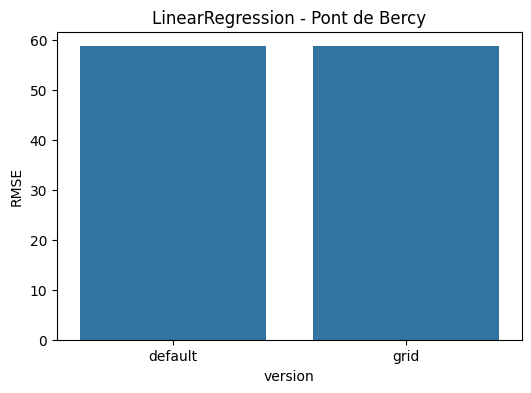

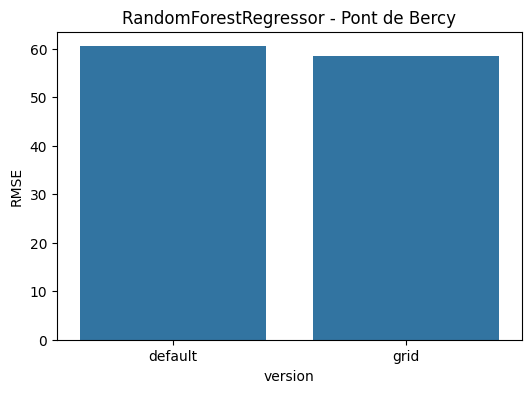

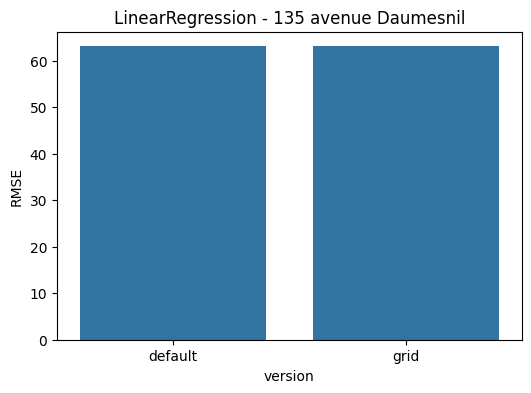

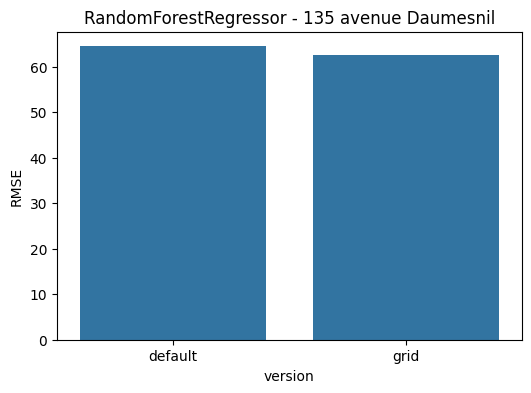

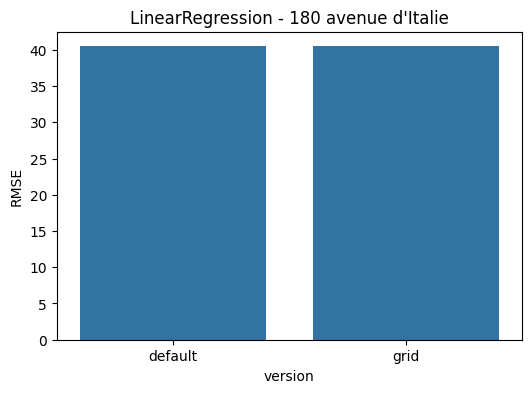

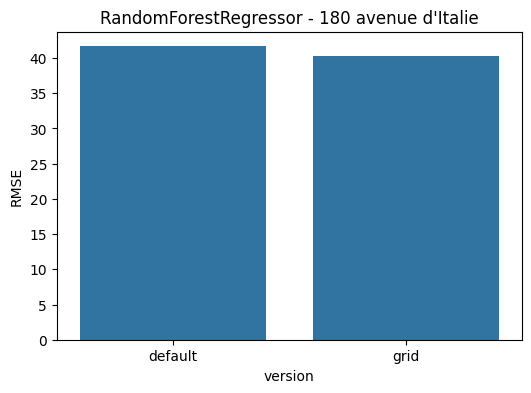

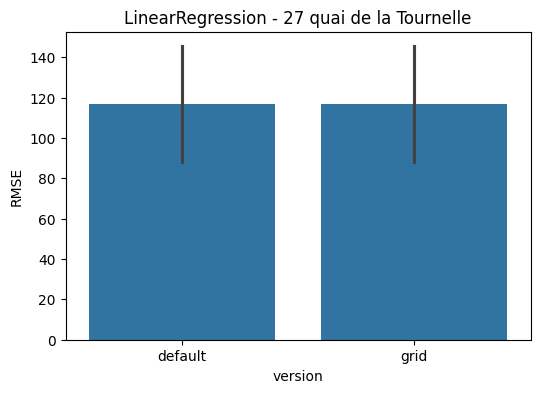

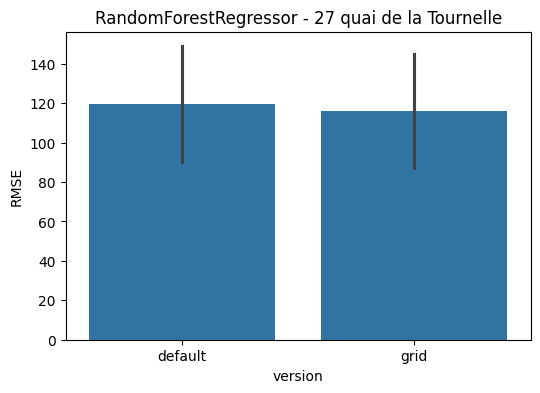

In [29]:

import seaborn as sns
import matplotlib.pyplot as plt

# Graphique comparatif
for site in df_scores["site"].unique():
    df_site = df_scores[df_scores["site"] == site]
    for modele in df_site["modele"].unique():
        df_m = df_site[df_site["modele"] == modele]
        plt.figure(figsize=(6, 4))
        sns.barplot(data=df_m, x="version", y="RMSE")
        plt.title(f"{modele} - {site}")
        plt.ylabel("RMSE")
        plt.show()
